In [1]:
import torch.nn.functional as F
from typing import List, Tuple
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import math

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## Helper function

In [2]:
tau = 1.25
def lorenz_system(t, state, sigma=10, beta=8/3, rho=28):
    x, y, z = state
    dxdt = tau * (sigma * (y - x))
    dydt = tau * (x * (rho - z) - y)
    dzdt = tau * (x * y - beta * z)
    return [dxdt, dydt, dzdt]

In [3]:
def plot_output(data,generated):

    plt.figure(figsize=(12, 6))
    for i, label in enumerate(['x', 'y', 'z']):
        plt.subplot(3, 1, i+1)
        plt.plot(data[:, i], label=f'True {label}')
        plt.plot(generated[:, i], label=f'Predicted {label}')
        plt.legend()
        plt.ylabel(label)
    plt.xlabel('Time Steps')
    plt.suptitle('True vs Predicted')
    plt.show()

## Generate Data

In [4]:
np.random.seed(8)
torch.manual_seed(8)

epochs = 20

# Simulate the Lorenz system
t_span = (0, 50*epochs)
t_eval = np.linspace(t_span[0], t_span[1], 100000*epochs)
initial_state = [1.0, 1.0, 1.0]
solution = solve_ivp(lorenz_system, t_span, initial_state, t_eval=t_eval)
data = solution.y.T

# Normalize the data
data_mean = data.mean(axis=0)
data_std = data.std(axis=0)
data_normalized = (data - data_mean) / data_std

split = int(0.9 * len(data_normalized))
train_data = data_normalized[:split]
test_data = data_normalized[split:]

Data = torch.tensor(data_normalized, dtype=torch.float32).to(device)
X_train = torch.tensor(train_data, dtype=torch.float32).to(device)
X_test = torch.tensor(test_data, dtype=torch.float32).to(device)

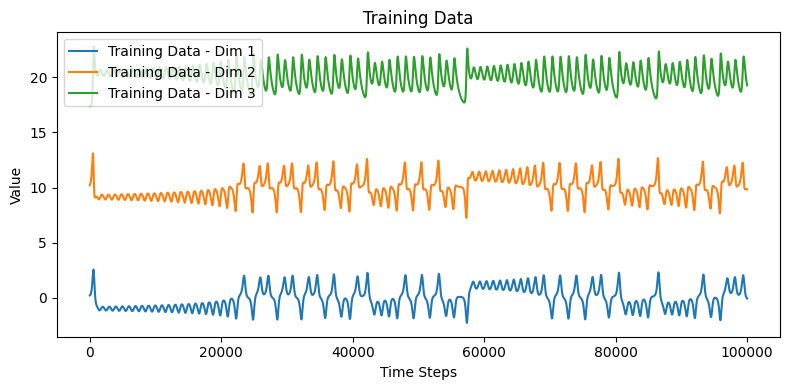

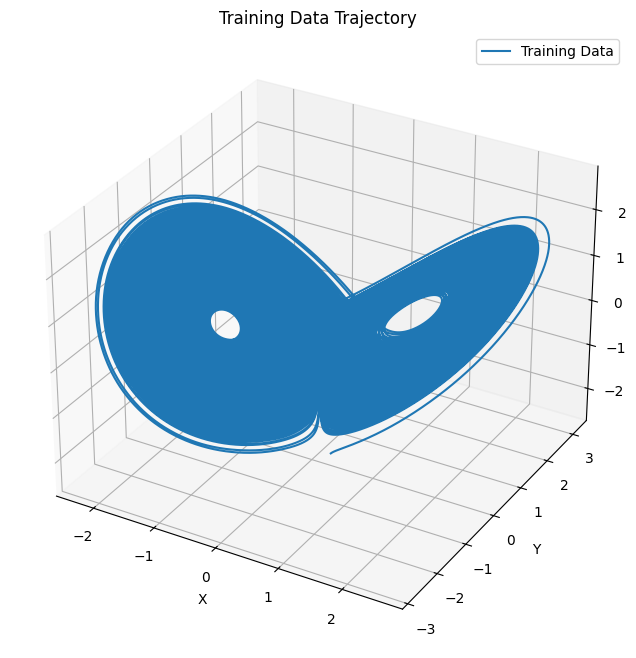

In [5]:
X_train_np = X_train.cpu().numpy()

# Plot training data
plt.figure(figsize=(8, 4))
for i in range(X_train_np.shape[1]):
    plt.plot(X_train_np[:100000, i] + i*10, label=f'Training Data - Dim {i+1}')
    plt.title(f'Training Data')
    plt.xlabel('Time Steps')
    plt.ylabel('Value')
    plt.legend()
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot(X_train_np[:, 0], X_train_np[:, 1], X_train_np[:, 2], label='Training Data')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Training Data Trajectory')
ax.legend()
plt.show()

## ML-SNN Model

In [6]:
@torch.jit.script
def compute_output(s_e: torch.Tensor, s_i: torch.Tensor, weight: torch.Tensor, bias: torch.Tensor) -> torch.Tensor:
    cat = torch.cat([s_e, s_i], 1)
    return F.linear(cat, weight, bias)

@torch.jit.script
def compute_derivatives(
    V_e: torch.Tensor, n_e: torch.Tensor, s_e: torch.Tensor,
    V_i: torch.Tensor, n_i: torch.Tensor, s_i: torch.Tensor,
    I_e: torch.Tensor, I_i: torch.Tensor,
    omega_ee: torch.Tensor, omega_ei: torch.Tensor, 
    omega_ie: torch.Tensor, omega_ii: torch.Tensor,
    V1: float, V2: float, V3: float, V4: float,
    T_max: float, V_t: float, K_p: float,
    g_Ca: float, V_Ca: float, g_K: float, V_K: float, g_L: float, V_L: float,
    phi: float, ar_e: float, ad_e: float, ar_i: float, ad_i: float,
    gbar_e: float, gbar_i: float, E_ampa: float, E_gaba: float,
    Cm: float
) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]:
    m_inf_e = 0.5 * (1 + torch.tanh((V_e - V1) / V2))
    n_inf_e = 0.5 * (1 + torch.tanh((V_e - V3) / V4))
    # tau_n_e = 1.0 / torch.cosh((V_e - V3) / (2 * V4))
    tau_n_e = 1.0
    TM_e = T_max / (1 + torch.exp(-(V_e - V_t) / K_p))
    
    m_inf_i = 0.5 * (1 + torch.tanh((V_i - V1) / V2))
    n_inf_i = 0.5 * (1 + torch.tanh((V_i - V3) / V4))
    # tau_n_i = 1.0 / torch.cosh((V_i - V3) / (2 * V4))
    tau_n_i = 1.0
    TM_i = T_max / (1 + torch.exp(-(V_i - V_t) / K_p))
    
    I_syn_e = (gbar_e * torch.mm(s_e, omega_ee.transpose(0,1)) * (V_e - E_ampa) +
               gbar_i * torch.mm(s_i, omega_ei.transpose(0,1)) * (V_e - E_gaba))
    I_syn_i = (gbar_e * torch.mm(s_e, omega_ie.transpose(0,1)) * (V_i - E_ampa) +
               gbar_i * torch.mm(s_i, omega_ii.transpose(0,1)) * (V_i - E_gaba))
    
    dV_e = (I_e - g_L*(V_e - V_L) - g_K*n_e*(V_e - V_K) - g_Ca*m_inf_e*(V_e - V_Ca) - I_syn_e) / Cm
    dn_e = phi*(n_inf_e - n_e) / tau_n_e
    ds_e = ar_e * TM_e * (1.0 - s_e) - ad_e * s_e
    
    dV_i = (I_i - g_L*(V_i - V_L) - g_K*n_i*(V_i - V_K) - g_Ca*m_inf_i*(V_i - V_Ca) - I_syn_i) / Cm
    dn_i = phi*(n_inf_i - n_i) / tau_n_i
    ds_i = ar_i * TM_i * (1.0 - s_i) - ad_i * s_i
    
    return dV_e, dn_e, ds_e, dV_i, dn_i, ds_i

@torch.jit.script
def rk4_step(
    V_e: torch.Tensor, n_e: torch.Tensor, s_e: torch.Tensor,
    V_i: torch.Tensor, n_i: torch.Tensor, s_i: torch.Tensor,
    I_e: torch.Tensor, I_i: torch.Tensor, dt: float,
    omega_ee: torch.Tensor, omega_ei: torch.Tensor, 
    omega_ie: torch.Tensor, omega_ii: torch.Tensor,
    V1: float, V2: float, V3: float, V4: float,
    T_max: float, V_t: float, K_p: float,
    g_Ca: float, V_Ca: float, g_K: float, V_K: float, g_L: float, V_L: float,
    phi: float, ar_e: float, ad_e: float, ar_i: float, ad_i: float,
    gbar_e: float, gbar_i: float, E_ampa: float, E_gaba: float,
    Cm: float
) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]:
    k1 = compute_derivatives(V_e, n_e, s_e, V_i, n_i, s_i, I_e, I_i,
                             omega_ee, omega_ei, omega_ie, omega_ii,
                             V1, V2, V3, V4, T_max, V_t, K_p,
                             g_Ca, V_Ca, g_K, V_K, g_L, V_L,
                             phi, ar_e, ad_e, ar_i, ad_i,
                             gbar_e, gbar_i, E_ampa, E_gaba, Cm)
    V_e_k2 = V_e + 0.5 * dt * k1[0]
    n_e_k2 = n_e + 0.5 * dt * k1[1]
    s_e_k2 = s_e + 0.5 * dt * k1[2]
    V_i_k2 = V_i + 0.5 * dt * k1[3]
    n_i_k2 = n_i + 0.5 * dt * k1[4]
    s_i_k2 = s_i + 0.5 * dt * k1[5]
    k2 = compute_derivatives(V_e_k2, n_e_k2, s_e_k2, V_i_k2, n_i_k2, s_i_k2, I_e, I_i,
                             omega_ee, omega_ei, omega_ie, omega_ii,
                             V1, V2, V3, V4, T_max, V_t, K_p,
                             g_Ca, V_Ca, g_K, V_K, g_L, V_L,
                             phi, ar_e, ad_e, ar_i, ad_i,
                             gbar_e, gbar_i, E_ampa, E_gaba, Cm)
    V_e_k3 = V_e + 0.5 * dt * k2[0]
    n_e_k3 = n_e + 0.5 * dt * k2[1]
    s_e_k3 = s_e + 0.5 * dt * k2[2]
    V_i_k3 = V_i + 0.5 * dt * k2[3]
    n_i_k3 = n_i + 0.5 * dt * k2[4]
    s_i_k3 = s_i + 0.5 * dt * k2[5]
    k3 = compute_derivatives(V_e_k3, n_e_k3, s_e_k3, V_i_k3, n_i_k3, s_i_k3, I_e, I_i,
                             omega_ee, omega_ei, omega_ie, omega_ii,
                             V1, V2, V3, V4, T_max, V_t, K_p,
                             g_Ca, V_Ca, g_K, V_K, g_L, V_L,
                             phi, ar_e, ad_e, ar_i, ad_i,
                             gbar_e, gbar_i, E_ampa, E_gaba, Cm)
    V_e_k4 = V_e + dt * k3[0]
    n_e_k4 = n_e + dt * k3[1]
    s_e_k4 = s_e + dt * k3[2]
    V_i_k4 = V_i + dt * k3[3]
    n_i_k4 = n_i + dt * k3[4]
    s_i_k4 = s_i + dt * k3[5]
    k4 = compute_derivatives(V_e_k4, n_e_k4, s_e_k4, V_i_k4, n_i_k4, s_i_k4, I_e, I_i,
                             omega_ee, omega_ei, omega_ie, omega_ii,
                             V1, V2, V3, V4, T_max, V_t, K_p,
                             g_Ca, V_Ca, g_K, V_K, g_L, V_L,
                             phi, ar_e, ad_e, ar_i, ad_i,
                             gbar_e, gbar_i, E_ampa, E_gaba, Cm)
    V_e_new = V_e + (dt/6.0) * (k1[0] + 2*k2[0] + 2*k3[0] + k4[0])
    n_e_new = n_e + (dt/6.0) * (k1[1] + 2*k2[1] + 2*k3[1] + k4[1])
    s_e_new = s_e + (dt/6.0) * (k1[2] + 2*k2[2] + 2*k3[2] + k4[2])
    V_i_new = V_i + (dt/6.0) * (k1[3] + 2*k2[3] + 2*k3[3] + k4[3])
    n_i_new = n_i + (dt/6.0) * (k1[4] + 2*k2[4] + 2*k3[4] + k4[4])
    s_i_new = s_i + (dt/6.0) * (k1[5] + 2*k2[5] + 2*k3[5] + k4[5])
    return V_e_new, n_e_new, s_e_new, V_i_new, n_i_new, s_i_new


@torch.jit.script
def integrate_chunk_with_output(
    input: torch.Tensor,
    chunk_size: int,
    init_V_e: torch.Tensor, init_n_e: torch.Tensor, init_s_e: torch.Tensor,
    init_V_i: torch.Tensor, init_n_i: torch.Tensor, init_s_i: torch.Tensor,
    dt: float, I: float,
    omega_ee: torch.Tensor, omega_ei: torch.Tensor, 
    omega_ie: torch.Tensor, omega_ii: torch.Tensor,
    V1: float, V2: float, V3: float, V4: float,
    T_max: float, V_t: float, K_p: float,
    g_Ca: float, V_Ca: float, g_K: float, V_K: float, g_L: float, V_L: float,
    phi: float, ar_e: float, ad_e: float, ar_i: float, ad_i: float,
    gbar_e: float, gbar_i: float, E_ampa: float, E_gaba: float,
    Cm: float,
    proj_weight: torch.Tensor, proj_bias: torch.Tensor,
    out_weight: torch.Tensor, out_bias: torch.Tensor
) -> Tuple[torch.Tensor, 
           Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor],
           Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]]:
    steps = chunk_size
    
    V_e, n_e, s_e = init_V_e, init_n_e, init_s_e
    V_i, n_i, s_i = init_V_i, init_n_i, init_s_i

    outputs = [] 
    
    V_e_list = torch.jit.annotate(List[torch.Tensor], [])
    n_e_list = torch.jit.annotate(List[torch.Tensor], [])
    s_e_list = torch.jit.annotate(List[torch.Tensor], [])
    V_i_list = torch.jit.annotate(List[torch.Tensor], [])
    n_i_list = torch.jit.annotate(List[torch.Tensor], [])
    s_i_list = torch.jit.annotate(List[torch.Tensor], [])

    # projected_input = 80 * torch.tanh(F.linear(input, proj_weight, proj_bias) + I)
    projected_input = F.linear(input * 40.0, proj_weight, proj_bias) + I

    NE = V_e.size(1)
    I_e = projected_input[:, :NE]
    I_i = projected_input[:, NE:]
    
    for t in range(steps):       
        V_e, n_e, s_e, V_i, n_i, s_i = rk4_step(
            V_e, n_e, s_e, V_i, n_i, s_i, I_e, I_i, dt,
            omega_ee, omega_ei, omega_ie, omega_ii,
            V1, V2, V3, V4, T_max, V_t, K_p,
            g_Ca, V_Ca, g_K, V_K, g_L, V_L,
            phi, ar_e, ad_e, ar_i, ad_i,
            gbar_e, gbar_i, E_ampa, E_gaba, Cm)

        out = compute_output(s_e, s_i, out_weight, out_bias)
        outputs.append(out)
        
        V_e_list.append(V_e[0].clone())
        n_e_list.append(n_e[0].clone())
        s_e_list.append(s_e[0].clone())
        V_i_list.append(V_i[0].clone())
        n_i_list.append(n_i[0].clone())
        s_i_list.append(s_i[0].clone())

    outputs_tensor = torch.stack(outputs, dim=0)
    final_states = (V_e, n_e, s_e, V_i, n_i, s_i)
    all_states = (torch.stack(V_e_list, dim=0),
                  torch.stack(n_e_list, dim=0),
                  torch.stack(s_e_list, dim=0),
                  torch.stack(V_i_list, dim=0),
                  torch.stack(n_i_list, dim=0),
                  torch.stack(s_i_list, dim=0))
    return outputs_tensor, final_states, all_states
    
# --------------------------------------------------------------------
# Morris-Lecar SNN Model
# --------------------------------------------------------------------
class MorrisLecarSNN(nn.Module):
    def __init__(self, input_size, output_size, chunk_size, NE=250, NI=250, dt=0.1,
                 Cm=20.0, g_Ca=4.0, g_K=8.0, g_L=2.0, V_Ca=120.0, V_K=-84.0, V_L=-60.0,
                 phi=0.067, V1=-1.2, V2=18.0, V3=12.0, V4=17.4, ar_e=3.0, ad_e=0.1,
                 ar_i=3.0, ad_i=0.1, T_max=1.0, V_t=2.0, K_p=5.0, gbar_e=1.0, gbar_i=1.0,
                 E_ampa=0.0, E_gaba=-75.0, I= 70.0):
        super(MorrisLecarSNN, self).__init__()
        self.NE = NE
        self.NI = NI
        self.dt = dt
        self.hidden_size = NE + NI
        self.chunk_size = chunk_size

        # Model parameters
        self.I = I
        self.Cm = Cm
        self.g_Ca = g_Ca
        self.g_K = g_K
        self.g_L = g_L
        self.V_Ca = V_Ca
        self.V_K = V_K
        self.V_L = V_L
        self.phi = phi
        self.V1 = V1
        self.V2 = V2
        self.V3 = V3
        self.V4 = V4
        self.ar_e = ar_e
        self.ad_e = ad_e
        self.ar_i = ar_i
        self.ad_i = ad_i
        self.T_max = T_max
        self.V_t = V_t
        self.K_p = K_p
        self.gbar_e = gbar_e
        self.gbar_i = gbar_i
        self.E_ampa = E_ampa
        self.E_gaba = E_gaba

        self.previous_output = None
        self.current_input = None

        # Input layer
        self.input_projection = nn.Linear(input_size, self.hidden_size)
        
        # Synaptic weights
        self.omega_ee_raw = nn.Parameter(torch.randn(NE, NE, device=device))
        self.omega_ei_raw = nn.Parameter(torch.randn(NE, NE, device=device))
        self.omega_ie_raw = nn.Parameter(torch.randn(NE, NE, device=device))
        self.omega_ii_raw = nn.Parameter(torch.randn(NE, NE, device=device))
        
        # Upper bound
        self.upper_bound = 1 / math.sqrt(self.hidden_size)

        # Output layer
        self.output_layer = nn.Linear(self.hidden_size, output_size)

        # State storage (if needed)
        self.store_states = False
        self._storage = None
        self._storage_idx = 0
    
    # Property to get bounded omega matrices
    @property
    def omega_ee(self):
        return torch.sigmoid(self.omega_ee_raw) * self.upper_bound
    
    @property
    def omega_ei(self):
        return torch.sigmoid(self.omega_ei_raw) * self.upper_bound
    
    @property
    def omega_ie(self):
        return torch.sigmoid(self.omega_ie_raw) * self.upper_bound
    
    @property
    def omega_ii(self):
        return torch.sigmoid(self.omega_ii_raw) * self.upper_bound
    
    def _init_storage(self, total_steps: int):
        device = self.input_projection.weight.device
        self._storage = {
            'V_e': torch.zeros(total_steps, self.NE, device=device),
            'n_e': torch.zeros(total_steps, self.NE, device=device),
            's_e': torch.zeros(total_steps, self.NE, device=device),
            'V_i': torch.zeros(total_steps, self.NI, device=device),
            'n_i': torch.zeros(total_steps, self.NI, device=device),
            's_i': torch.zeros(total_steps, self.NI, device=device)
        }
        self._storage_idx = 0

    def enable_storage(self, total_steps: int):
        self.store_states = True
        self._init_storage(total_steps)

    def disable_storage(self):
        self.store_states = False
        self._storage = None
        self._storage_idx = 0

    def get_storage(self):
        return self._storage

    def _init_states(self):
        device = self.input_projection.weight.device
        V_e = 30 * torch.rand((1, self.NE), device=device)
        n_e = torch.rand((1, self.NE), device=device)
        s_e = torch.zeros((1, self.NE), device=device)
        V_i = -50 + 30 * torch.rand((1, self.NI), device=device)
        n_i = torch.rand((1, self.NI), device=device)
        s_i = torch.zeros((1, self.NI), device=device)
        return (V_e, n_e, s_e, V_i, n_i, s_i)

    def forward(self, input, states=None, teacher_forcing_alpha=None):
        outputs_list = []

        if states is None:
            states = self._init_states()

        if self.current_input == None:
            self.current_input = input
        else:
            self.current_input = (1 - teacher_forcing_alpha) * self.previous_output + teacher_forcing_alpha * input
        
        # We need to get the projection and output layer parameters.
        proj_weight = self.input_projection.weight
        proj_bias = self.input_projection.bias
        out_weight = self.output_layer.weight
        out_bias = self.output_layer.bias

        # Call the scripted integration function that returns outputs for each step in the chunk.
        chunk_outputs, states, all_states = integrate_chunk_with_output(
            self.current_input, self.chunk_size, states[0], states[1], states[2],
            states[3], states[4], states[5],
            self.dt, self.I,
            self.omega_ee, self.omega_ei, self.omega_ie, self.omega_ii,
            self.V1, self.V2, self.V3, self.V4,
            self.T_max, self.V_t, self.K_p,
            self.g_Ca, self.V_Ca, self.g_K, self.V_K, self.g_L, self.V_L,
            self.phi, self.ar_e, self.ad_e, self.ar_i, self.ad_i,
            self.gbar_e, self.gbar_i, self.E_ampa, self.E_gaba,
            self.Cm,
            proj_weight, proj_bias,
            out_weight, out_bias
        )
       
        self.previous_output = chunk_outputs[-1].detach()
        chunk_outputs = chunk_outputs.transpose(0, 1)
        outputs_list.append(chunk_outputs)
        if self.store_states:
            steps = self.chunk_size
            with torch.no_grad():
                self._storage['V_e'][self._storage_idx:self._storage_idx + steps] = all_states[0]
                self._storage['n_e'][self._storage_idx:self._storage_idx + steps] = all_states[1]
                self._storage['s_e'][self._storage_idx:self._storage_idx + steps] = all_states[2]
                self._storage['V_i'][self._storage_idx:self._storage_idx + steps] = all_states[3]
                self._storage['n_i'][self._storage_idx:self._storage_idx + steps] = all_states[4]
                self._storage['s_i'][self._storage_idx:self._storage_idx + steps] = all_states[5]
                self._storage_idx += steps
        
        outputs = torch.cat(outputs_list, dim=1)
        return outputs, states

    def test(self, input, test_lenght, states=None):
        batch_size, _ = input.shape
        outputs_list = []

        if states is None:
            states = self._init_states(batch_size)

        test_input = input
      
        proj_weight = self.input_projection.weight
        proj_bias = self.input_projection.bias
        out_weight = self.output_layer.weight
        out_bias = self.output_layer.bias

        for start in range(0, test_lenght - self.chunk_size + 1 , self.chunk_size):
            chunk_outputs, states, all_states = integrate_chunk_with_output(
                test_input, self.chunk_size, states[0], states[1], states[2],
                states[3], states[4], states[5],
                self.dt, self.I,
                self.omega_ee, self.omega_ei, self.omega_ie, self.omega_ii,
                self.V1, self.V2, self.V3, self.V4,
                self.T_max, self.V_t, self.K_p,
                self.g_Ca, self.V_Ca, self.g_K, self.V_K, self.g_L, self.V_L,
                self.phi, self.ar_e, self.ad_e, self.ar_i, self.ad_i,
                self.gbar_e, self.gbar_i, self.E_ampa, self.E_gaba,
                self.Cm,
                proj_weight, proj_bias,
                out_weight, out_bias
            )
           
            test_input = chunk_outputs[-1,:,:]
            chunk_outputs = chunk_outputs.transpose(0, 1)
            outputs_list.append(chunk_outputs)
            if self.store_states:
                steps = self.chunk_size
                with torch.no_grad():
                    self._storage['V_e'][self._storage_idx:self._storage_idx + steps] = all_states[0]
                    self._storage['n_e'][self._storage_idx:self._storage_idx + steps] = all_states[1]
                    self._storage['s_e'][self._storage_idx:self._storage_idx + steps] = all_states[2]
                    self._storage['V_i'][self._storage_idx:self._storage_idx + steps] = all_states[3]
                    self._storage['n_i'][self._storage_idx:self._storage_idx + steps] = all_states[4]
                    self._storage['s_i'][self._storage_idx:self._storage_idx + steps] = all_states[5]
                    self._storage_idx += steps
        outputs = torch.cat(outputs_list, dim=1)
        return outputs

    def warmup(self, input, warmup_duration, states=None):
        with torch.no_grad():
            outputs_list = []
    
            if states is None:
                states = self._init_states()

            proj_weight = self.input_projection.weight
            proj_bias = self.input_projection.bias
            out_weight = self.output_layer.weight
            out_bias = self.output_layer.bias

            chunk_outputs, states, _ = integrate_chunk_with_output(
                input, warmup_duration, states[0], states[1], states[2],
                states[3], states[4], states[5],
                self.dt, self.I,
                self.omega_ee, self.omega_ei, self.omega_ie, self.omega_ii,
                self.V1, self.V2, self.V3, self.V4,
                self.T_max, self.V_t, self.K_p,
                self.g_Ca, self.V_Ca, self.g_K, self.V_K, self.g_L, self.V_L,
                self.phi, self.ar_e, self.ad_e, self.ar_i, self.ad_i,
                self.gbar_e, self.gbar_i, self.E_ampa, self.E_gaba,
                self.Cm,
                proj_weight, proj_bias,
                out_weight, out_bias
            )
           
        return states, chunk_outputs[-1,:,:]


    def plot_full_state(self, num_neurons=5, neuron_offset=2.0, figure_name=""):
        if not self.store_states or self._storage is None:
            print("Storage not enabled or no data stored!")
            return
        
        store = {k: v.cpu().numpy() for k, v in self._storage.items()}
        time_steps = store['V_e'].shape[0]
        time = np.arange(0, time_steps) * self.dt

        fig = plt.figure(figsize=(18, 12))
        plt.suptitle("Neuronal State Dynamics (T=100s)", fontsize=16)
        gs = fig.add_gridspec(3, 2)
        axs = {
            'V_e': fig.add_subplot(gs[0, 0]),
            'V_i': fig.add_subplot(gs[0, 1]),
            'n_e': fig.add_subplot(gs[1, 0]),
            'n_i': fig.add_subplot(gs[1, 1]),
            's_e': fig.add_subplot(gs[2, 0]),
            's_i': fig.add_subplot(gs[2, 1])
        }

        rand_e = np.random.choice(self.NE, num_neurons, replace=False)
        rand_i = np.random.choice(self.NI, num_neurons, replace=False)

        for idx, n in enumerate(rand_e):
            offset = idx * neuron_offset
            axs['V_e'].plot(time, (store['V_e'][:, n]) / 150 + offset, label=f'Neuron {n}')
            axs['n_e'].plot(time, store['n_e'][:, n] + offset)
            axs['s_e'].plot(time, store['s_e'][:, n] + offset)

        for idx, n in enumerate(rand_i):
            offset = idx * neuron_offset
            axs['V_i'].plot(time, (store['V_i'][:, n]) / 150 + offset, label=f'Neuron {n}')
            axs['n_i'].plot(time, store['n_i'][:, n] + offset)
            axs['s_i'].plot(time, store['s_i'][:, n] + offset)

        titles = {
            'V_e': "Excitatory Membrane Potentials",
            'V_i': "Inhibitory Membrane Potentials",
            'n_e': "Excitatory Gating Variables",
            'n_i': "Inhibitory Gating Variables",
            's_e': "Excitatory Synaptic Variables",
            's_i': "Inhibitory Synaptic Variables"
        }
        for key, ax in axs.items():
            ax.set_title(titles[key])
            ax.set_xlabel("Time (s)")
            ax.grid(True, alpha=0.3)
            if key in ['V_e', 'V_i']:
                ax.legend()

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        if figure_name:
            plt.savefig(figure_name, bbox_inches='tight')
        plt.show()

## Define the ML-SNN architecture and training parameters

In [7]:
np.random.seed(8)
torch.manual_seed(8)

def gtf_alpha_schedule(epoch, num_epochs, max_alpha=1.0, min_alpha=0.5):
    return max_alpha - (max_alpha - min_alpha) * (epoch / num_epochs)

chunk_size = 200

states = None

model = MorrisLecarSNN(input_size=3, output_size=3, chunk_size=chunk_size, NE=1000, NI=1000).to(device)

optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-4)

criterion = nn.MSELoss()
signal_len = int(X_train.size(0)/epochs)
warmup_duration = 500 #50 ms

scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

initial_model_ckeckpoint = 'Lorenz-initial.pth'
trained_model_checkpoint = 'Lorenz-final.pth'

In [8]:
torch.save(model.state_dict(), initial_model_ckeckpoint)
print(f"Initial model state saved to {initial_model_ckeckpoint}")

Initial model state saved to Lorenz-initial.pth


## Training loop


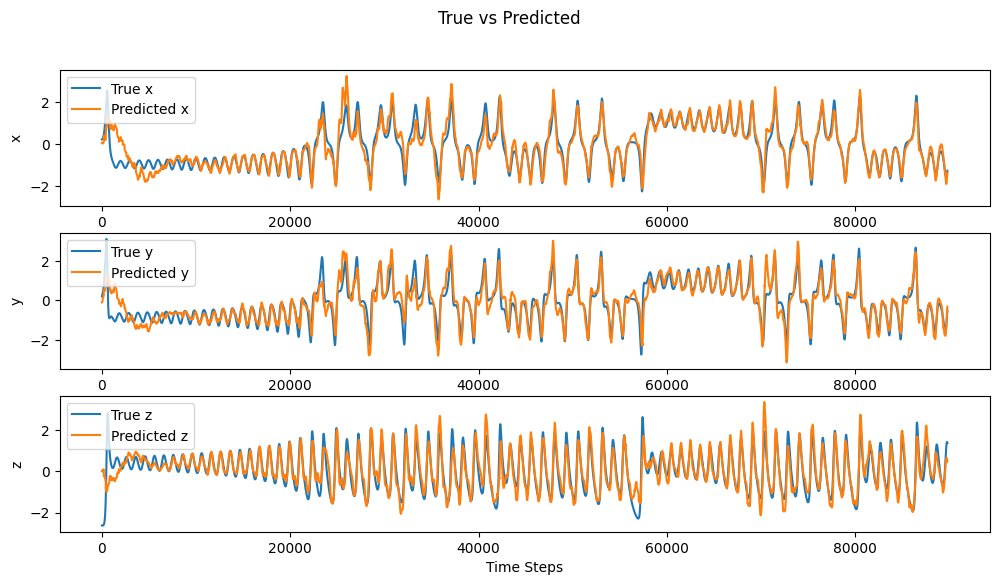

Epoch [1/20], Loss: 0.08495873333984884, ChunkSize: 200, tf: 1.0


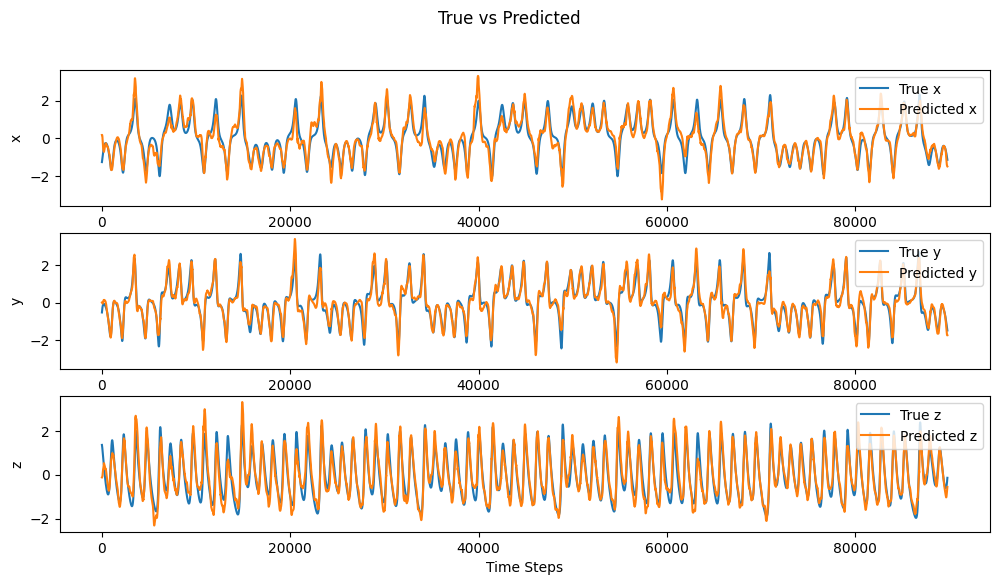

Epoch [2/20], Loss: 0.0527623652010561, ChunkSize: 200, tf: 0.975


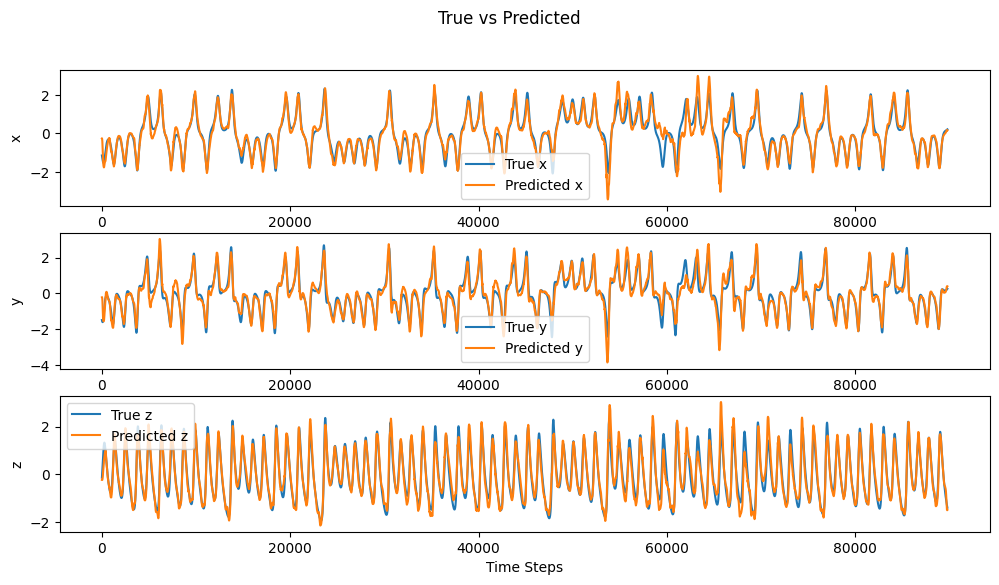

Epoch [3/20], Loss: 0.0410965996617232, ChunkSize: 200, tf: 0.95


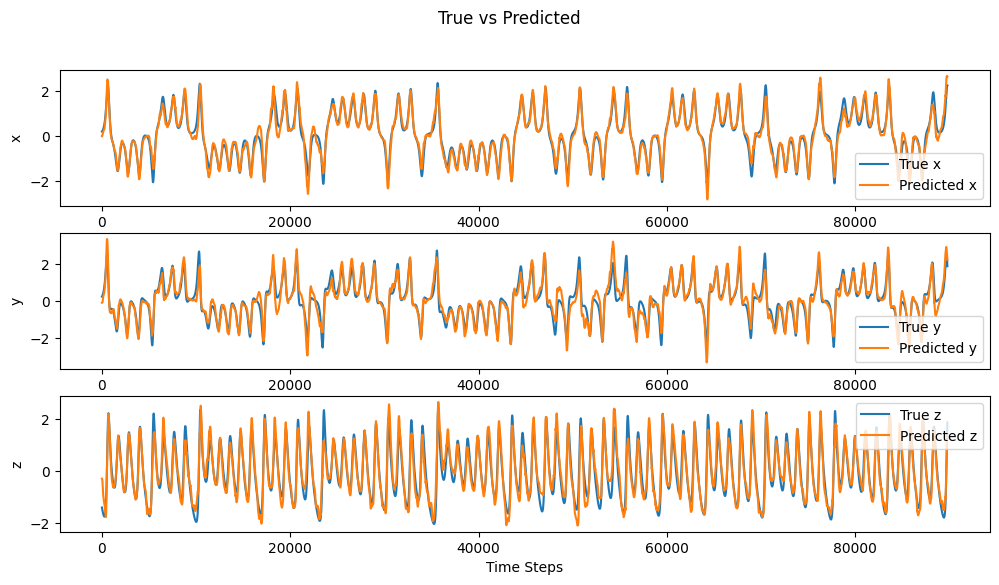

Epoch [4/20], Loss: 0.04134910035046367, ChunkSize: 200, tf: 0.925


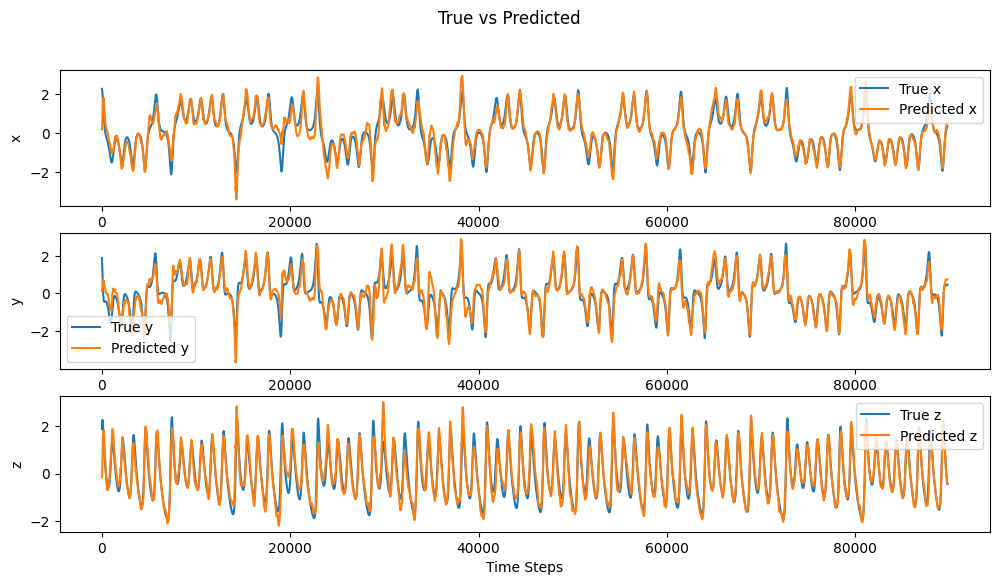

Epoch [5/20], Loss: 0.04616740877972489, ChunkSize: 200, tf: 0.9


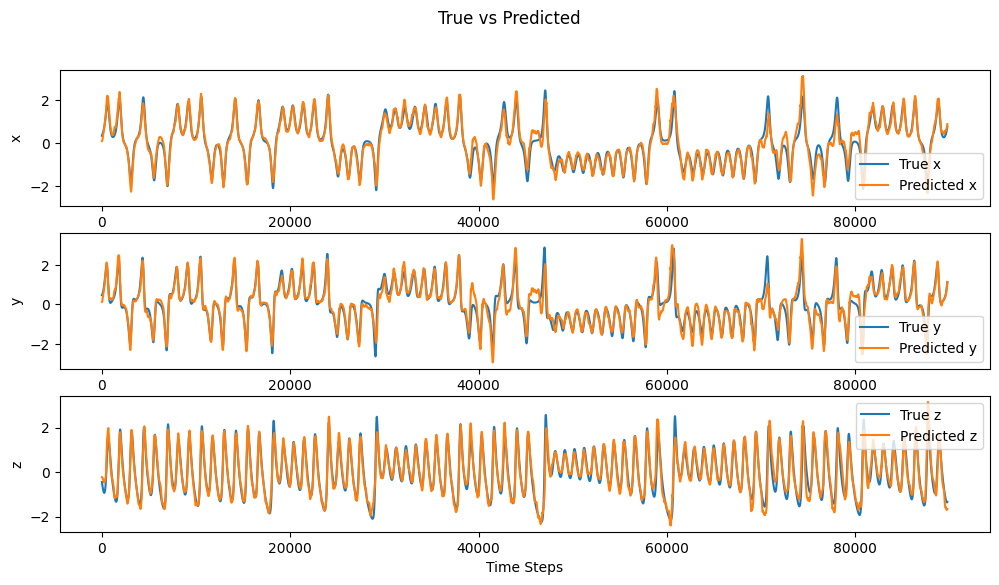

Epoch [6/20], Loss: 0.03696649547773446, ChunkSize: 200, tf: 0.875


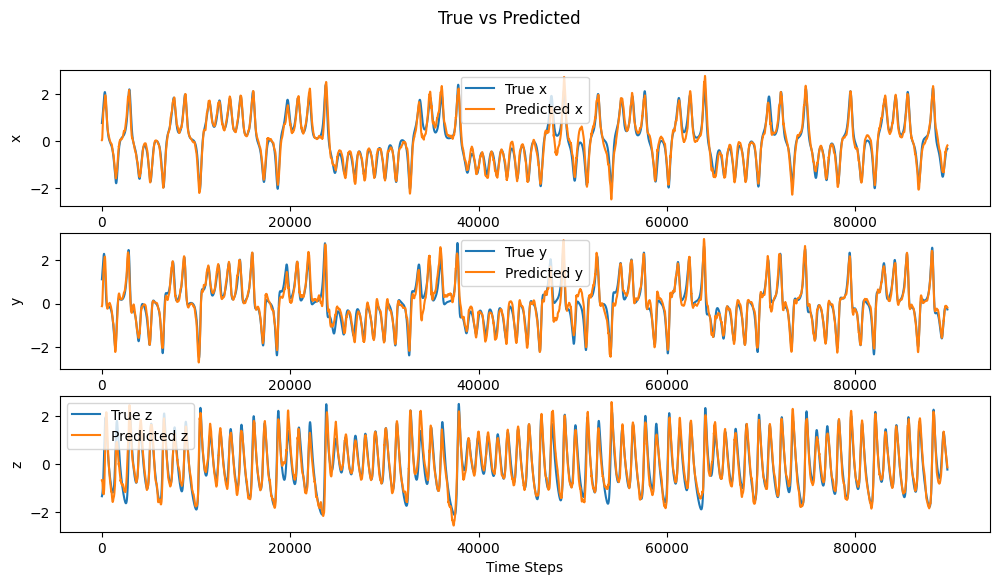

Epoch [7/20], Loss: 0.02928198482910379, ChunkSize: 200, tf: 0.85


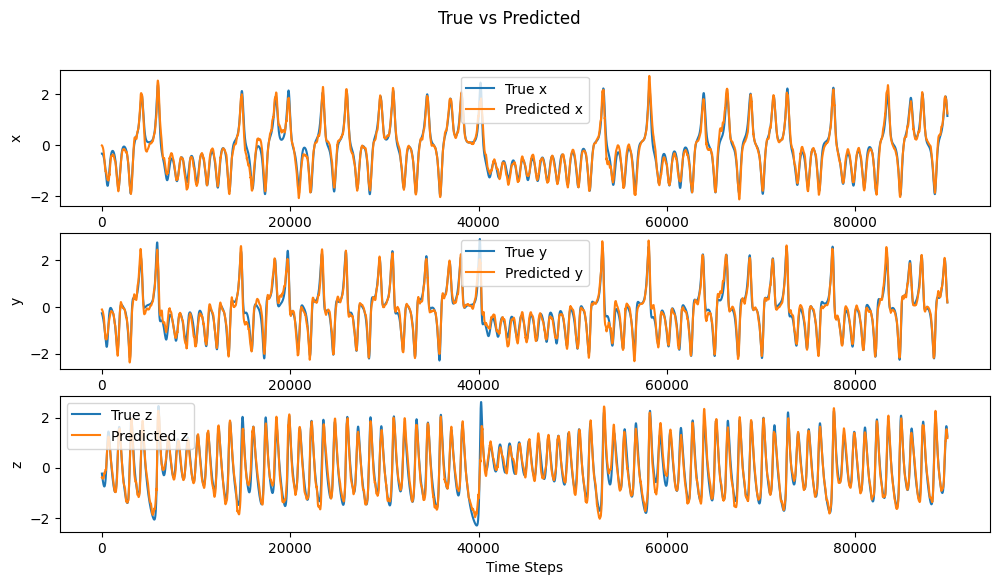

Epoch [8/20], Loss: 0.015770789457860077, ChunkSize: 200, tf: 0.825


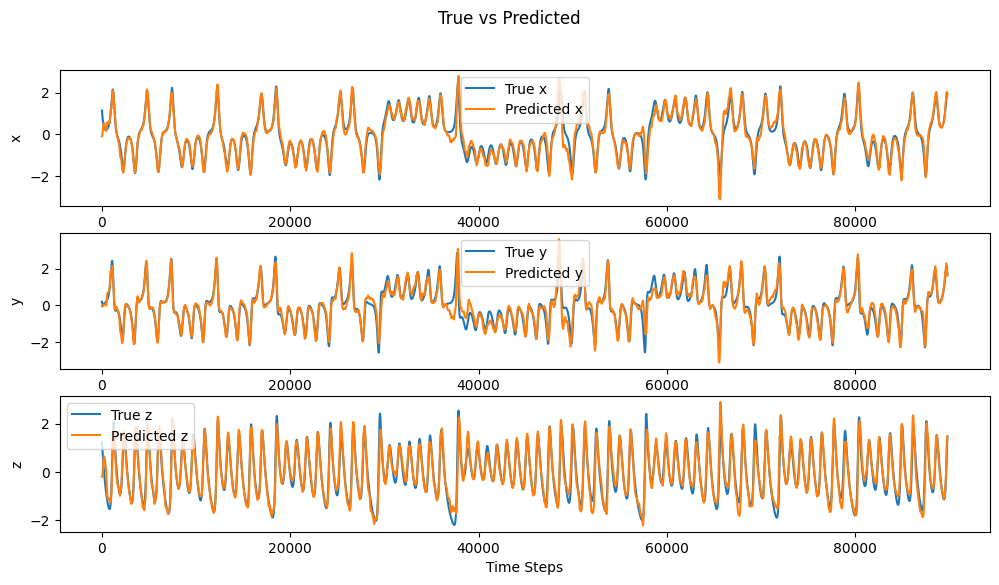

Epoch [9/20], Loss: 0.03248197459594709, ChunkSize: 200, tf: 0.8


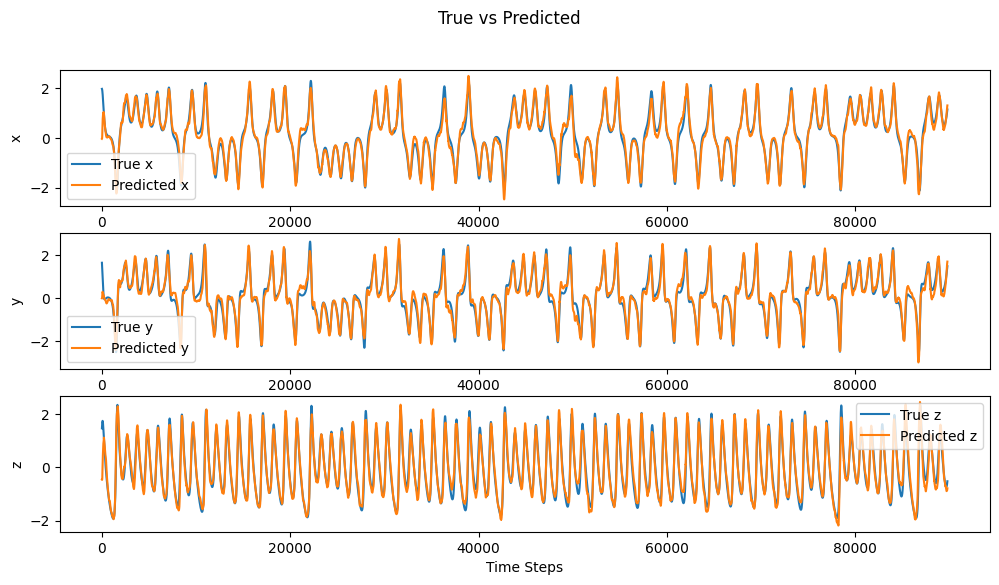

Epoch [10/20], Loss: 0.017269493899234455, ChunkSize: 200, tf: 0.775


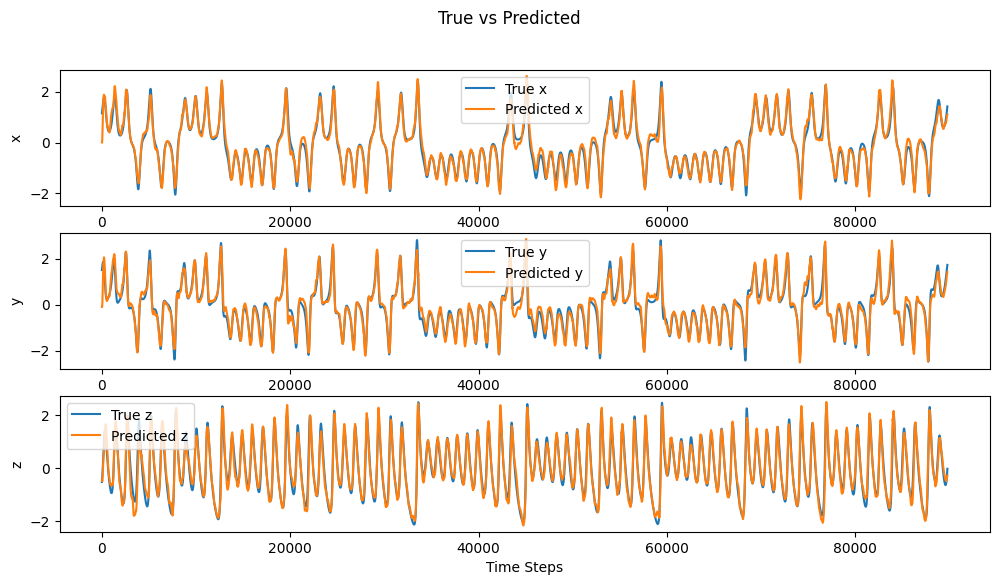

Epoch [11/20], Loss: 0.01729751085343413, ChunkSize: 200, tf: 0.75


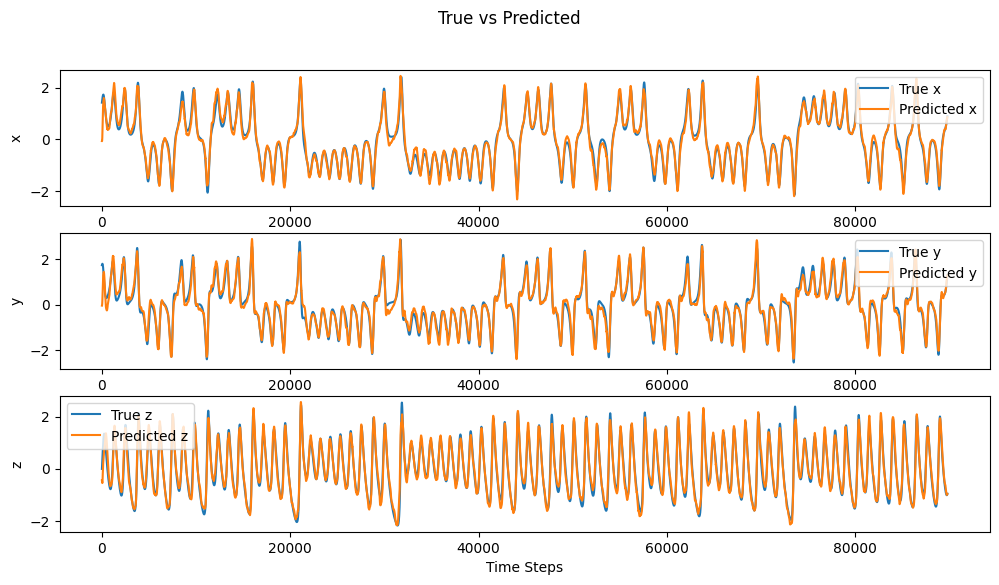

Epoch [12/20], Loss: 0.01248185284765534, ChunkSize: 200, tf: 0.725


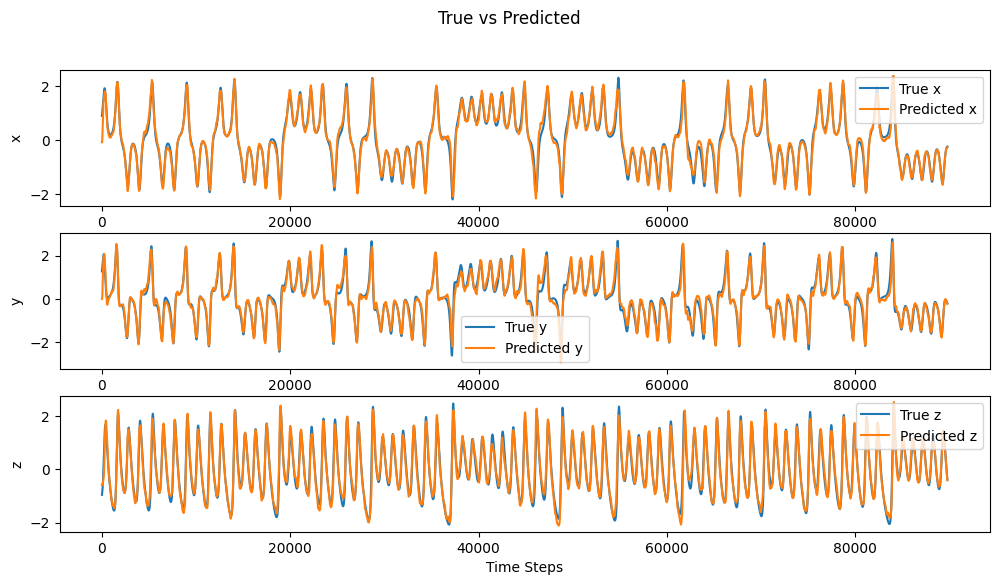

Epoch [13/20], Loss: 0.013913859493355229, ChunkSize: 200, tf: 0.7


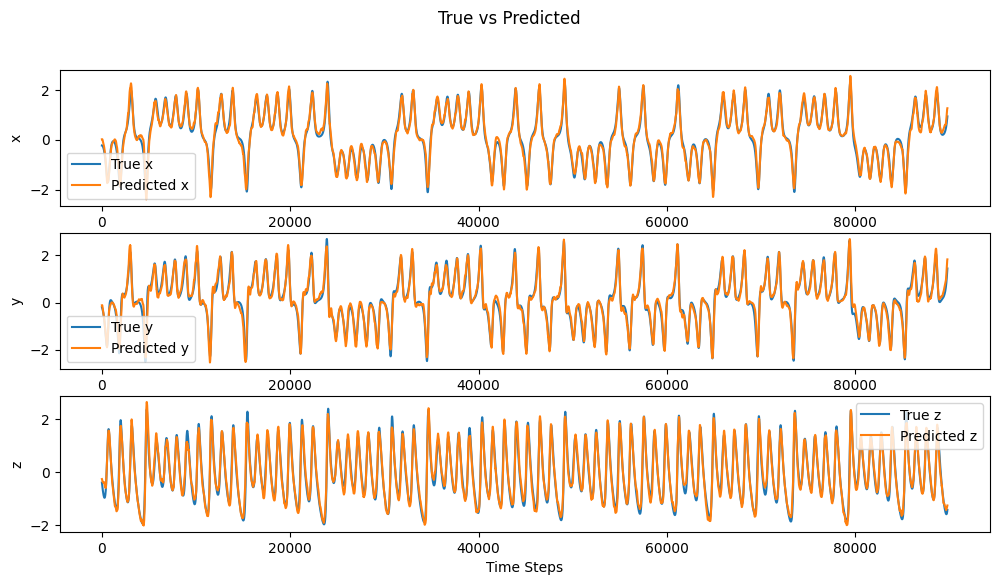

Epoch [14/20], Loss: 0.010426672110568734, ChunkSize: 200, tf: 0.675


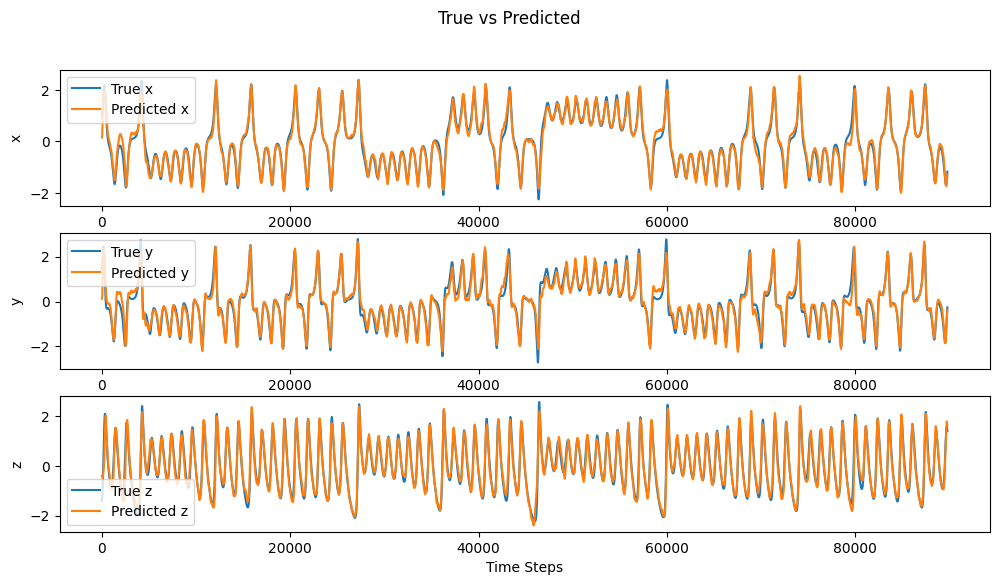

Epoch [15/20], Loss: 0.016766913224823866, ChunkSize: 200, tf: 0.65


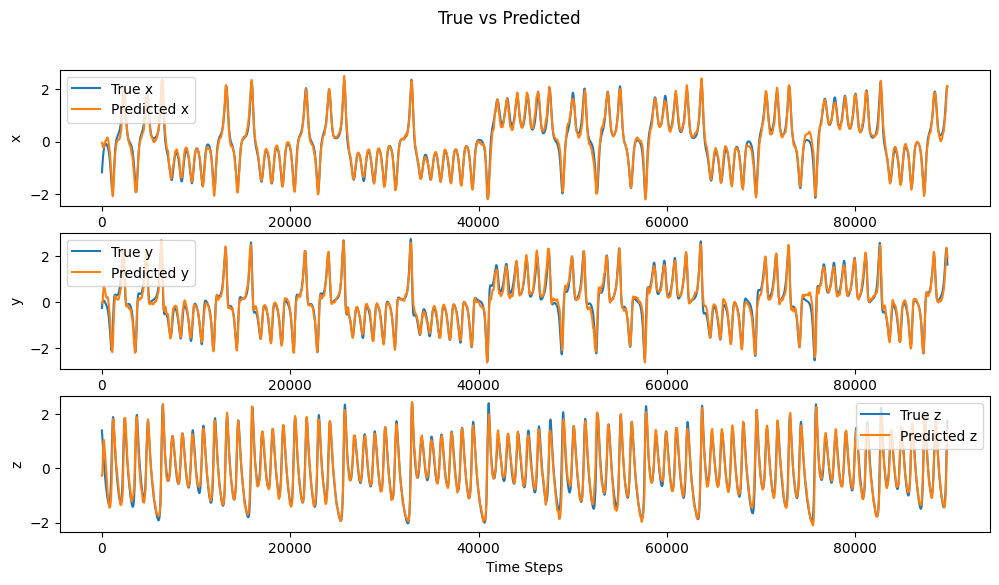

Epoch [16/20], Loss: 0.013247391527824852, ChunkSize: 200, tf: 0.625


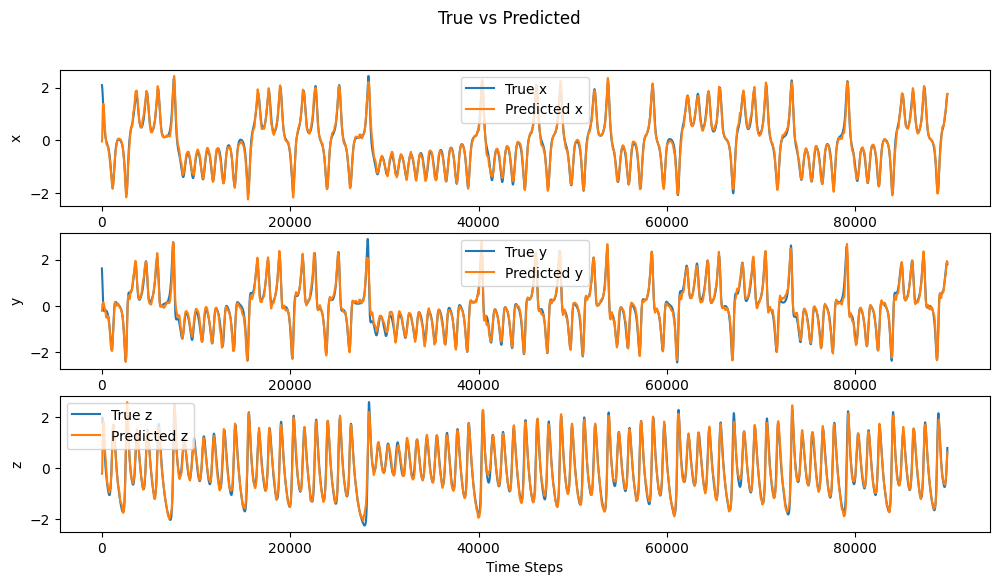

Epoch [17/20], Loss: 0.007731787861657291, ChunkSize: 200, tf: 0.6


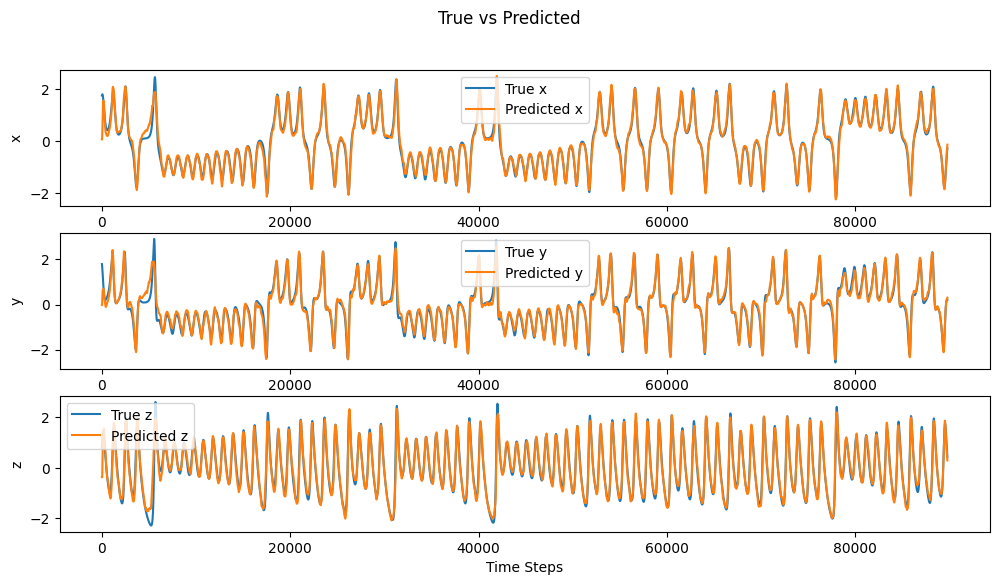

Epoch [18/20], Loss: 0.01197237612728475, ChunkSize: 200, tf: 0.575


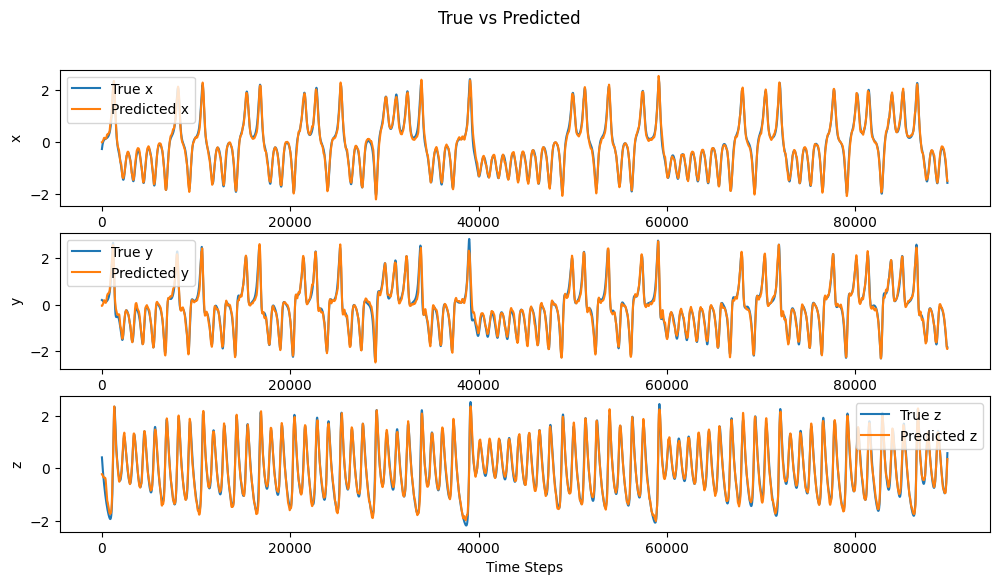

Epoch [19/20], Loss: 0.0056107004643935355, ChunkSize: 200, tf: 0.55


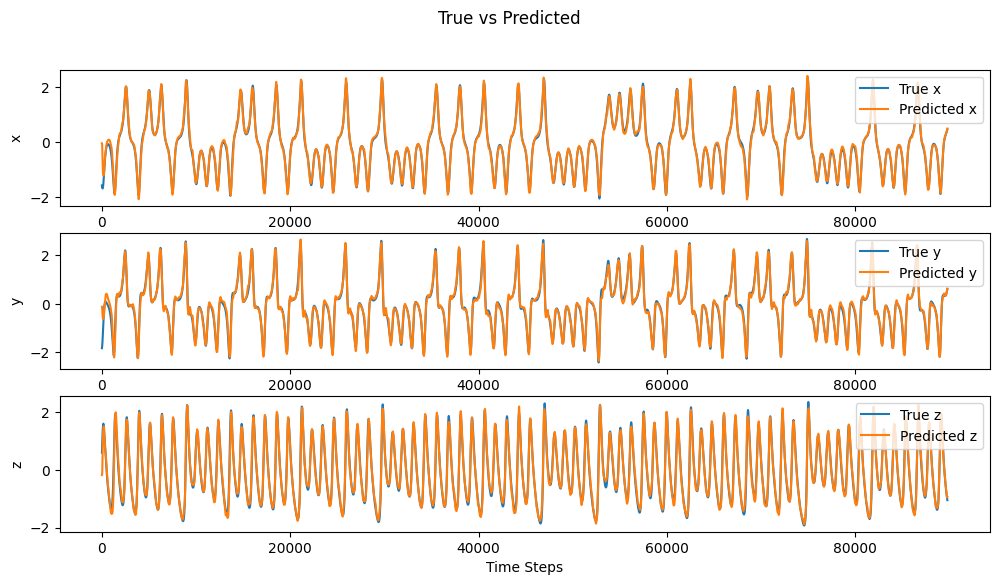

Epoch [20/20], Loss: 0.005226902066460745, ChunkSize: 200, tf: 0.525
Model and optimizer state saved successfully!
CPU times: user 47min 15s, sys: 1.74 s, total: 47min 17s
Wall time: 47min 15s


In [9]:
%%time

np.random.seed(8)
torch.manual_seed(8)

index = 0

for epoch in range(epochs):
    model.train()
    teacher_forcing_alpha = gtf_alpha_schedule(epoch, epochs)
    
    total_loss = 0
    states = None  
    epoch_outputs = []
    epoch_inputs = []
    model._storage_idx = 0
    with torch.no_grad():
        states, _ = model.warmup(torch.zeros(1, 3).to(device), warmup_duration, states)       

    for start in range(0, signal_len - chunk_size, chunk_size):
        end = index + chunk_size

        x_chunk = X_train[index,:].unsqueeze(0).to(device)
        y_chunk = X_train[index + 1:end + 1,:].unsqueeze(0).to(device)

        optimizer.zero_grad()
        
        outputs, states = model(x_chunk, states, teacher_forcing_alpha)

        epoch_outputs.append(outputs.squeeze().detach().cpu().numpy())
        epoch_inputs.append(y_chunk.squeeze().detach().cpu().numpy())

        loss = criterion(outputs, y_chunk)
        loss.backward()        
        optimizer.step()

        index = index + chunk_size

        if states is not None:
            states = tuple([state.detach() for state in states]) if isinstance(states, tuple) else states.detach()
        total_loss += loss.item()
        
    scheduler.step() 
    
    epoch_outputs = np.concatenate(epoch_outputs, axis=0)
    epoch_inputs = np.concatenate(epoch_inputs, axis=0)
    
    plot_output(epoch_inputs, epoch_outputs)

    avg_loss = (total_loss*100) / (signal_len - 1)
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {avg_loss}, ChunkSize: {chunk_size}, tf: {teacher_forcing_alpha}")

checkpoint = {
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict()
}

torch.save(checkpoint, trained_model_checkpoint)
print("Model and optimizer state saved successfully!")

In [8]:
checkpoint = torch.load(trained_model_checkpoint, map_location=device)

trained_model = MorrisLecarSNN(input_size=3, output_size=3, chunk_size=chunk_size, NE=1000, NI=1000).to(device)

trained_model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

## Testing the model

In [9]:
def generate_trajectory(model, initial_state, states, generation_len):
    model.eval()
    model.enable_storage(generation_len)
    with torch.no_grad():        
        output = model.test(initial_state, generation_len, states)
        generated = np.vstack((initial_state.squeeze(0).cpu().numpy(),output.squeeze(0).cpu().numpy()))

    return np.array(generated).squeeze()

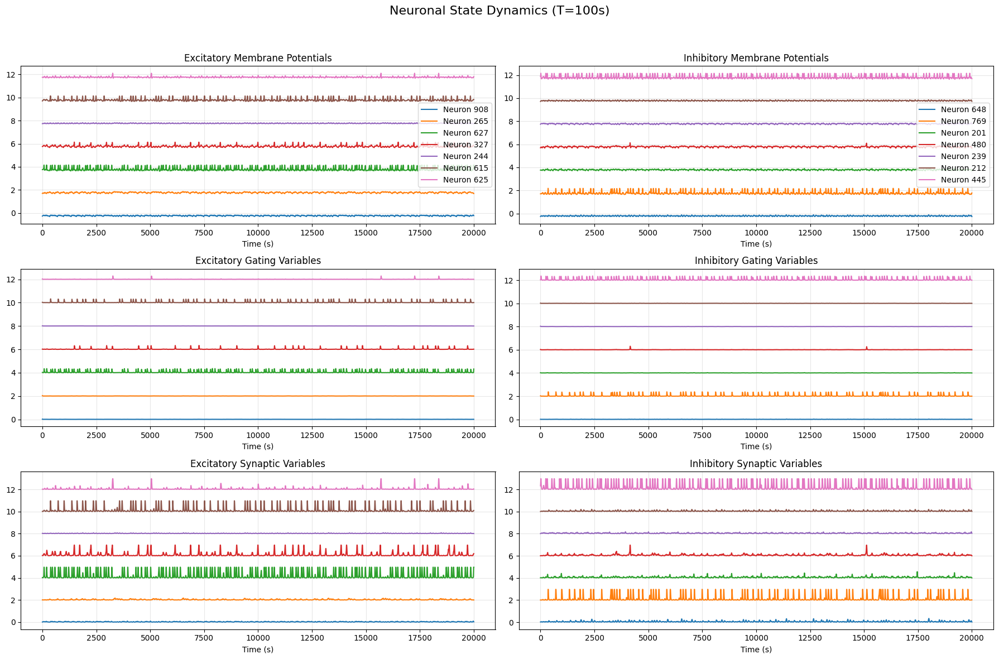

In [10]:
# Generate trajectory
np.random.seed(8)
torch.manual_seed(8)

initial_state = torch.tensor([1.0, 0.0, 0.0]).to(device)
states = None
states, initial_input = trained_model.warmup(initial_state.unsqueeze(0), warmup_duration, states)

generation_len = 200000
generated = generate_trajectory(trained_model, initial_input, states, generation_len)

trained_model.plot_full_state(num_neurons=7, figure_name="full_state_dynamics.png")

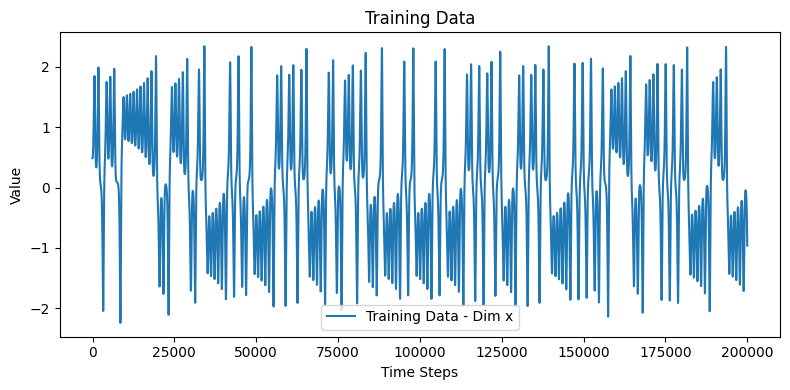

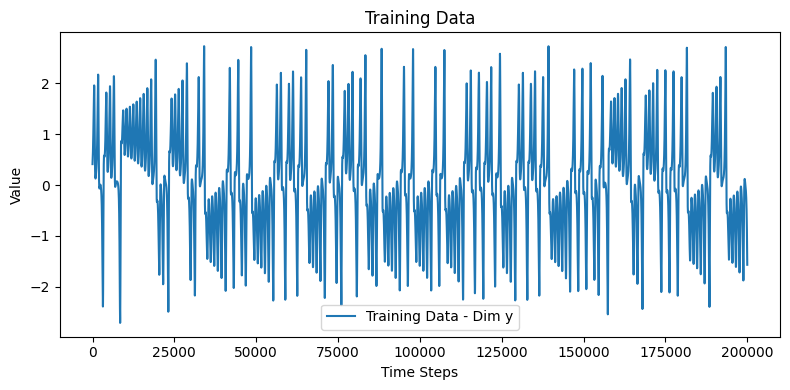

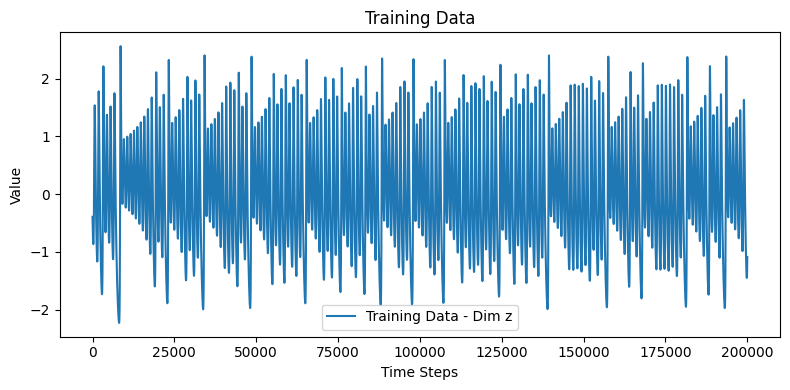

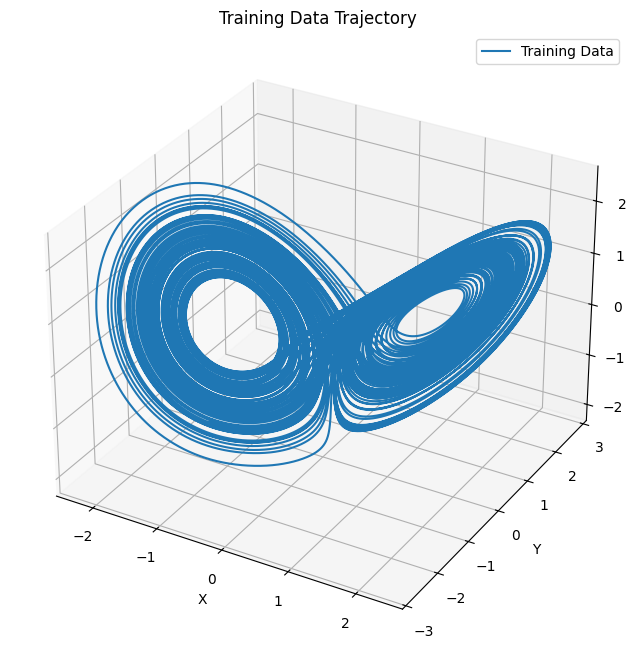

In [11]:
np.random.seed(8)
torch.manual_seed(8)

initial_state_denormalized = (initial_input.squeeze().cpu().numpy() * data_std) + data_mean

t_span = (0, 100)
t_eval = np.linspace(t_span[0], t_span[1], 200000)
solution = solve_ivp(lorenz_system, t_span, initial_state_denormalized, t_eval=t_eval)
test_data_unnormalized = solution.y.T

test_data_normalized = (test_data_unnormalized - data_mean) / data_std


plt.figure(figsize=(8, 4))
plt.plot(test_data_normalized[:, 0], label=f'Training Data - Dim x')
plt.title(f'Training Data')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(test_data_normalized[:, 1], label=f'Training Data - Dim y')
plt.title(f'Training Data')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(test_data_normalized[:, 2], label=f'Training Data - Dim z')
plt.title(f'Training Data')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot(test_data_normalized[:, 0], test_data_normalized[:, 1], test_data_normalized[:,2], label='Training Data')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Training Data Trajectory')
ax.legend()
plt.show()

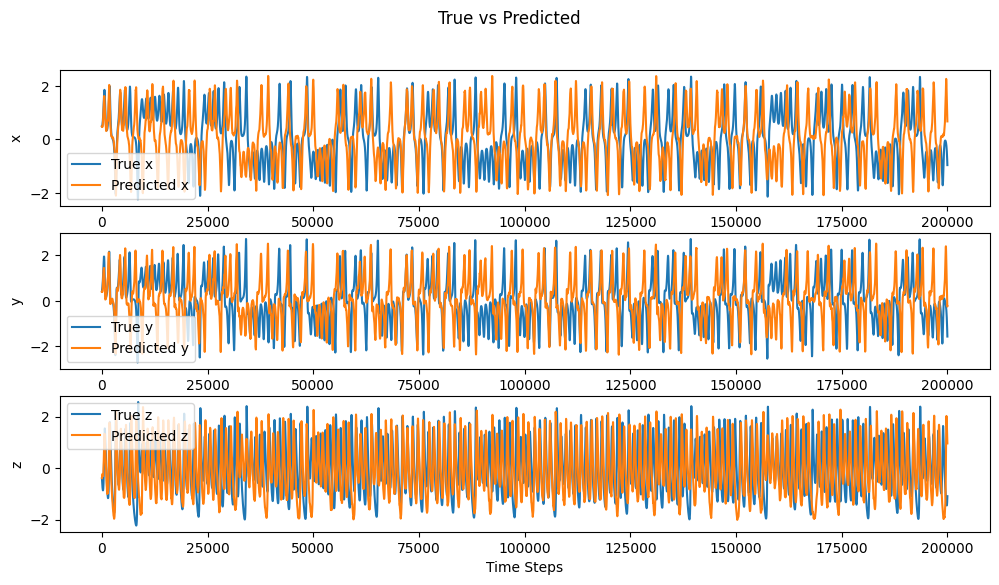

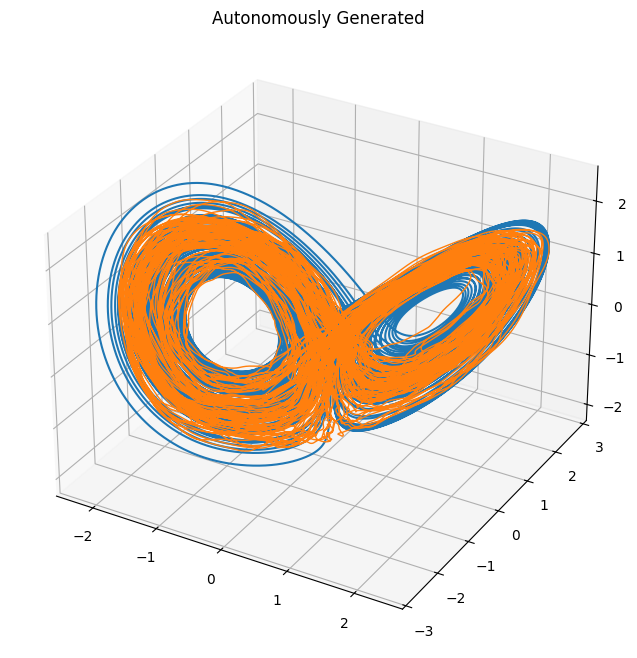

In [12]:
plt.figure(figsize=(12, 6))
for i, label in enumerate(['x', 'y', 'z']):
    plt.subplot(3, 1, i+1)
    # plt.plot(y_test_denorm[:, i], label=f'True {label}')
    plt.plot(test_data_normalized[:generation_len, i], label=f'True {label}')
    plt.plot(generated[:, i], label=f'Predicted {label}')
    plt.legend()
    plt.ylabel(label)
plt.xlabel('Time Steps')
plt.suptitle('True vs Predicted')
plt.show()


# # 3D Plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot(test_data_normalized[:generation_len, 0], test_data_normalized[:generation_len, 1], test_data_normalized[:generation_len, 2], label='Training Data')
ax.plot(generated[:, 0], generated[:, 1], generated[:, 2], lw=1)

ax.set_title('Autonomously Generated')
plt.show()

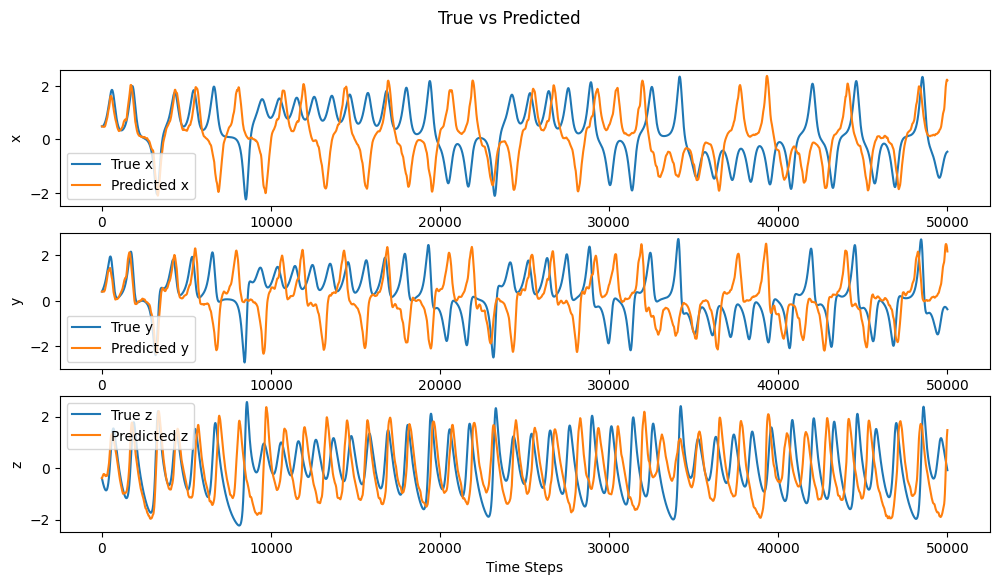

In [13]:
plt.figure(figsize=(12, 6))
for i, label in enumerate(['x', 'y', 'z']):
    plt.subplot(3, 1, i+1)
    # plt.plot(y_test_denorm[:, i], label=f'True {label}')
    plt.plot(test_data_normalized[:50000, i], label=f'True {label}')
    plt.plot(generated[:50000, i], label=f'Predicted {label}')
    plt.legend()
    plt.ylabel(label)
plt.xlabel('Time Steps')
plt.suptitle('True vs Predicted')
plt.show()

## Plot Figures

In [14]:
%config InlineBackend.figure_format = 'retina'

config = {
    'figure.figsize': (8, 6),
    'figure.autolayout': True,
    'font.size': 15,
    'lines.linewidth': 3,
    'axes.titlesize': 24,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,     
    'ytick.labelsize': 16,        
    'xtick.major.size': 5,
    'ytick.major.size': 5,
    'legend.fontsize': 18,
    'axes.spines.top': False,
    'axes.spines.right': False
}

plt.rcParams.update(config)

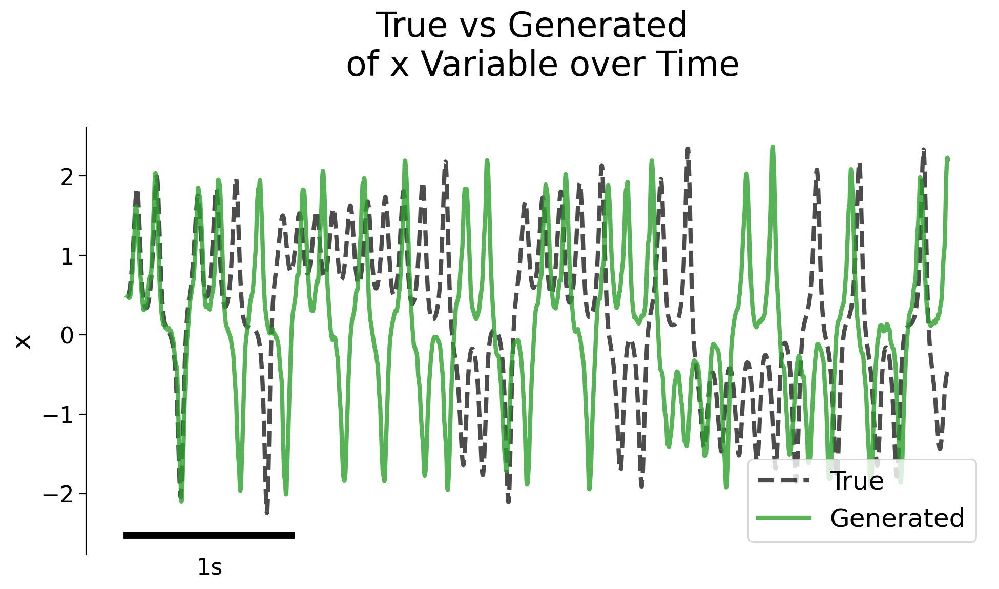

In [15]:
plt.figure(figsize=(10,6))

dt = 0.1

figure_generation_len = 50000

plt.title('True vs Generated \n of x Variable over Time', y=1.1)
plt.ylabel('x')
plt.plot(np.arange(0, figure_generation_len) * dt, test_data_normalized[1:figure_generation_len+1, 0],
         label="True", color='k', linestyle='--', alpha=0.7) # Black, Solid

plt.plot(np.arange(0, figure_generation_len) * dt, generated[:figure_generation_len, 0],
         label="Generated", color='#2ca02c', linestyle='-', alpha=0.8) # Matplotlib default green, Dashed

plt.legend()

plt.xticks([])

plt.gca().spines['bottom'].set_visible(False)


x_start = 0
x_end = 1000 # 
y_pos = plt.ylim()[0] - 0.01 * (plt.ylim()[1] - plt.ylim()[0])

plt.plot([x_start, x_end], [y_pos, y_pos], color='black', linewidth=5)
plt.text((x_start + x_end) / 2, y_pos - 0.05 * (plt.ylim()[1] - plt.ylim()[0]), "1s", 
         ha='center', va='top', fontsize=16)
plt.legend(loc='lower right')

plt.xticks() 
plt.yticks() 

plt.savefig('Lorenz-x variabl.svg', format='svg', dpi=300, bbox_inches='tight')
plt.show()

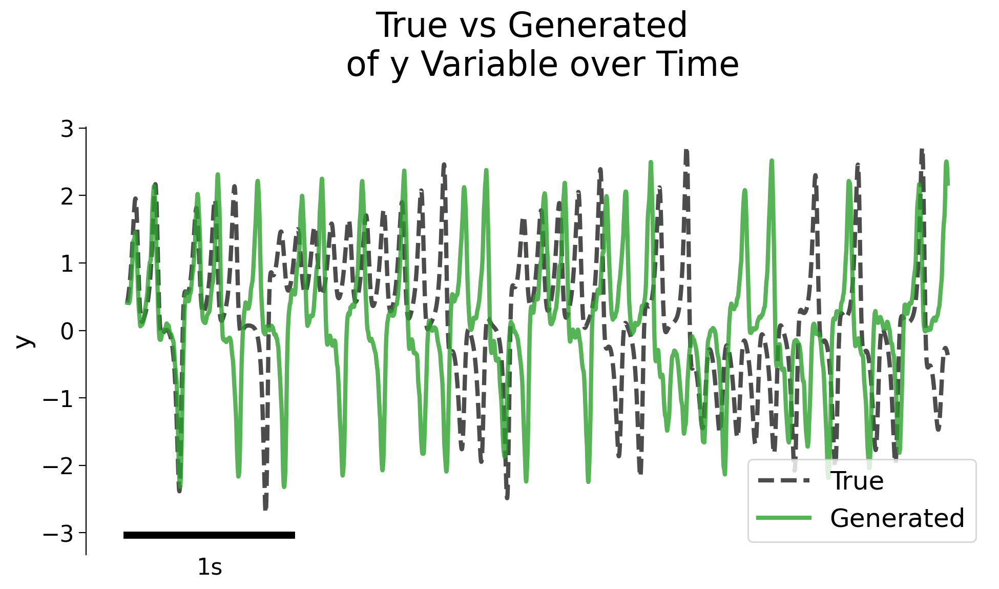

In [16]:
plt.figure(figsize=(10,6))

plt.title('True vs Generated \n of y Variable over Time', y=1.1)
plt.ylabel('y')
plt.plot(np.arange(0, figure_generation_len) * dt, test_data_normalized[1:figure_generation_len+1, 1],
         label="True", color='k', linestyle='--', alpha=0.7) # Black, Solid

plt.plot(np.arange(0, figure_generation_len) * dt, generated[:figure_generation_len, 1],
         label="Generated", color='#2ca02c', linestyle='-', alpha=0.8) # Matplotlib default green, Dashed

plt.legend()

plt.xticks([])

plt.gca().spines['bottom'].set_visible(False)


x_start = 0
x_end = 1000 # 
y_pos = plt.ylim()[0] - 0.01 * (plt.ylim()[1] - plt.ylim()[0])

plt.plot([x_start, x_end], [y_pos, y_pos], color='black', linewidth=5)
plt.text((x_start + x_end) / 2, y_pos - 0.05 * (plt.ylim()[1] - plt.ylim()[0]), "1s", 
         ha='center', va='top', fontsize=16)
plt.legend(loc='lower right')

plt.xticks() 
plt.yticks() 

plt.savefig('Lorenz-y variabl.svg', format='svg', dpi=300, bbox_inches='tight')
plt.show()

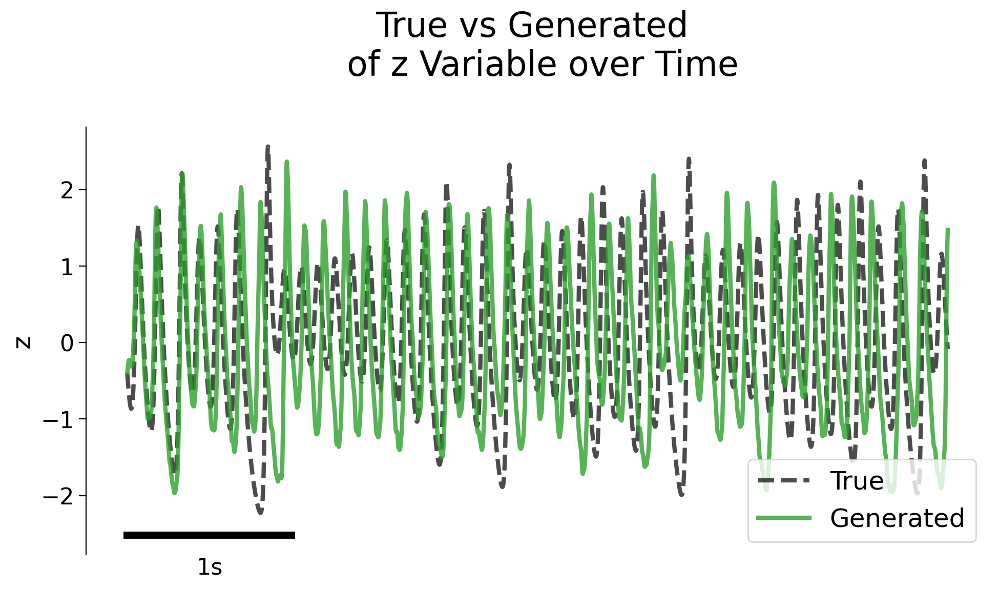

In [17]:
plt.figure(figsize=(10,6))

plt.title('True vs Generated \n of z Variable over Time', y=1.1)
plt.ylabel('z')
plt.plot(np.arange(0, figure_generation_len) * dt, test_data_normalized[1:figure_generation_len+1, 2],
         label="True", color='k', linestyle='--', alpha=0.7) # Black, Solid

plt.plot(np.arange(0, figure_generation_len) * dt, generated[:figure_generation_len, 2],
         label="Generated", color='#2ca02c', linestyle='-', alpha=0.8) # Matplotlib default green, Dashed

plt.legend()

plt.xticks([])

plt.gca().spines['bottom'].set_visible(False)


x_start = 0
x_end = 1000 # 
y_pos = plt.ylim()[0] - 0.01 * (plt.ylim()[1] - plt.ylim()[0])

plt.plot([x_start, x_end], [y_pos, y_pos], color='black', linewidth=5)
plt.text((x_start + x_end) / 2, y_pos - 0.05 * (plt.ylim()[1] - plt.ylim()[0]), "1s", 
         ha='center', va='top', fontsize=16)
plt.legend(loc='lower right')

plt.xticks() 
plt.yticks() 

plt.savefig('Lorenz-z variabl.svg', format='svg', dpi=300, bbox_inches='tight')
plt.show()

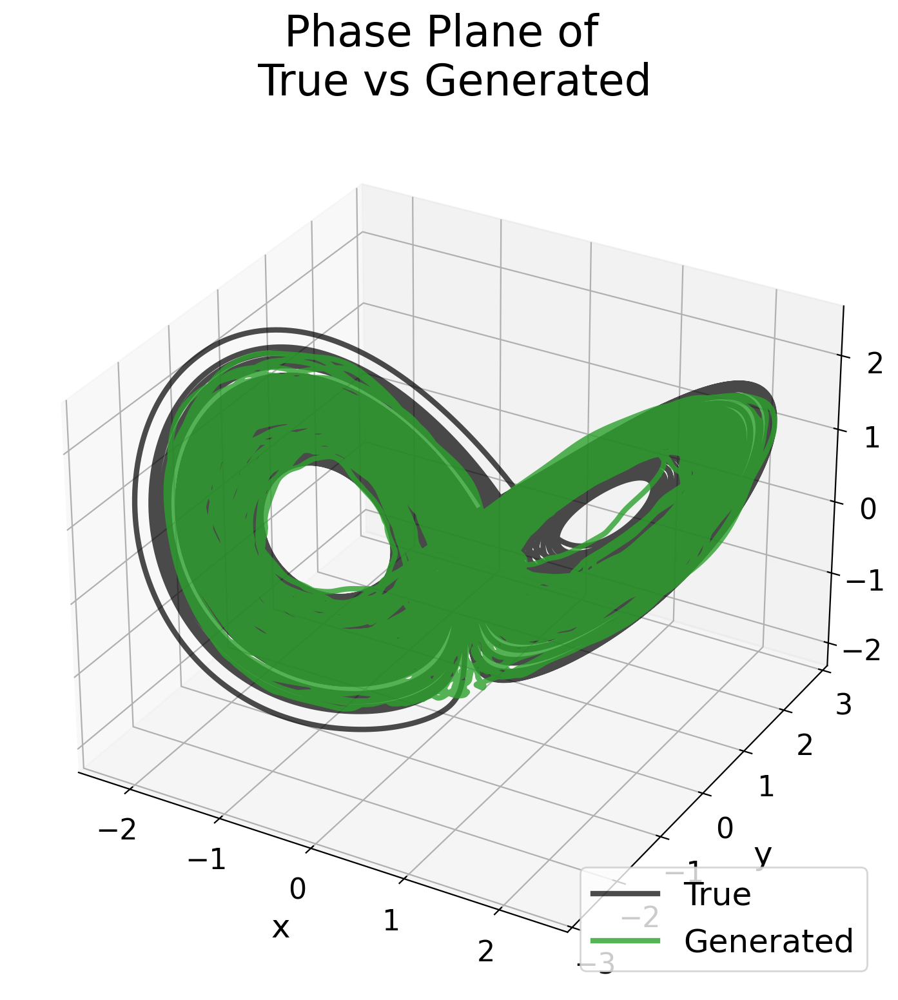

In [18]:
fig = plt.figure(figsize=(12, 8)) # Adjusted figsize for better 3D aspect ratio
ax = fig.add_subplot(111, projection='3d')


if hasattr(test_data_normalized, 'cpu'):
    ax.plot(test_data_normalized[:, 0].cpu().numpy(),
            test_data_normalized[:, 1].cpu().numpy(),
            test_data_normalized[:, 2].cpu().numpy(),
            label="True", color='k', linestyle='-', alpha=0.7)
else:
     ax.plot(test_data_normalized[:, 0],
             test_data_normalized[:, 1],
             test_data_normalized[:, 2],
             label="True", color='k', linestyle='-', alpha=0.7)

# Plot Generated data
if hasattr(generated, 'cpu'):
    ax.plot(generated[:, 0].cpu().numpy(),
            generated[:, 1].cpu().numpy(),
            generated[:, 2].cpu().numpy(),
            label="Generated", color='#2ca02c', linestyle='-', alpha=0.8)
else:
    ax.plot(generated[:, 0],
            generated[:, 1],
            generated[:, 2],
            label="Generated", color='#2ca02c', linestyle='-', alpha=0.8) # Matplotlib default green, Solid


ax.set_title('Phase Plane of \n True vs Generated', y=1.1) # Adjust title pos if needed

ax.set_xlabel('x', labelpad=10)
ax.set_ylabel('y', labelpad=10)
ax.set_zlabel('z')

ax.legend(loc='lower right')

ax.tick_params(axis='x')
ax.tick_params(axis='y')
ax.tick_params(axis='z')

plt.tight_layout()
plt.savefig('Lorenz-xyz_variable_3D.svg', format='svg', dpi=300, bbox_inches='tight')
plt.show()

In [19]:
def plot_voltage_trace_stacked(data, num_neurons=5, neuron_offset=1.0, figure_name_prefix="", dt=0.1, linewidth=1.5):

    store = {k: v.cpu().numpy() for k, v in data.items()}
    time_steps = store['V_e'].shape[0]
    time = np.arange(0, time_steps) * dt

    dt = 0.1

    rand_e = np.random.choice(1000, num_neurons, replace=False)
    rand_i = np.random.choice(1000, num_neurons, replace=False)

    plot_configs = {
        'V_e': ("Excitatory Membrane Potentials", 'D', store['V_e'], rand_e, lambda x: x / 150),
        'V_i': ("Inhibitory Membrane Potentials", 'E', store['V_i'], rand_i, lambda x: x / 150),
        'S_e': ("Excitatory Membrane Potentials", 'D', store['s_e'], rand_e, lambda x: x),
        'S_i': ("Inhibitory Membrane Potentials", 'E', store['s_i'], rand_i, lambda x: x),
    }

    for plot_key, (title, order, trace_data, neurons, transform) in plot_configs.items():
        fig = plt.figure(figsize=(12, 8))
        ax = fig.add_subplot(111)

        for idx, n in enumerate(neurons):
            offset = idx * neuron_offset
            
            plot_trace = transform(trace_data[:int(generation_len), n]) + offset + 1
            ax.plot(np.arange(0, generation_len) * dt, plot_trace, label=f'Neuron {n}')

            ax.plot(np.arange(0, generation_len) * dt, np.full_like(time, offset + 1), 
                    color='gray', linestyle='--', linewidth=0.8, alpha=0.7)
        
        # Hide the box/spines
        plt.gca().spines['bottom'].set_visible(False)
        plt.gca().spines['left'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)
        plt.gca().spines['top'].set_visible(False)
        
        # Set titles
        ax.set_title(title, y=1.05)
        ax.set_ylabel("Neurons")

        ax.set_yticks(np.arange(1, num_neurons + 1))
        ax.set_xticks([])
        
        ax.grid(True, alpha=0.3)

        plt.xticks([])
        
        x_start = 0
        x_end = 1000  
        y_pos = plt.ylim()[0] - 0.01 * (plt.ylim()[1] - plt.ylim()[0]) 
        
        plt.plot([x_start, x_end], [y_pos, y_pos], color='black', linewidth=5)
        plt.text((x_start + x_end) / 2, y_pos - 0.05 * (plt.ylim()[1] - plt.ylim()[0]), "1s", 
         ha='center', va='top', fontsize=16)
        
        if figure_name_prefix:
            filename = f"{figure_name_prefix}_{plot_key}.svg"
            plt.savefig(filename, format='svg', dpi=300, bbox_inches='tight')
        plt.show()
        plt.close(fig)

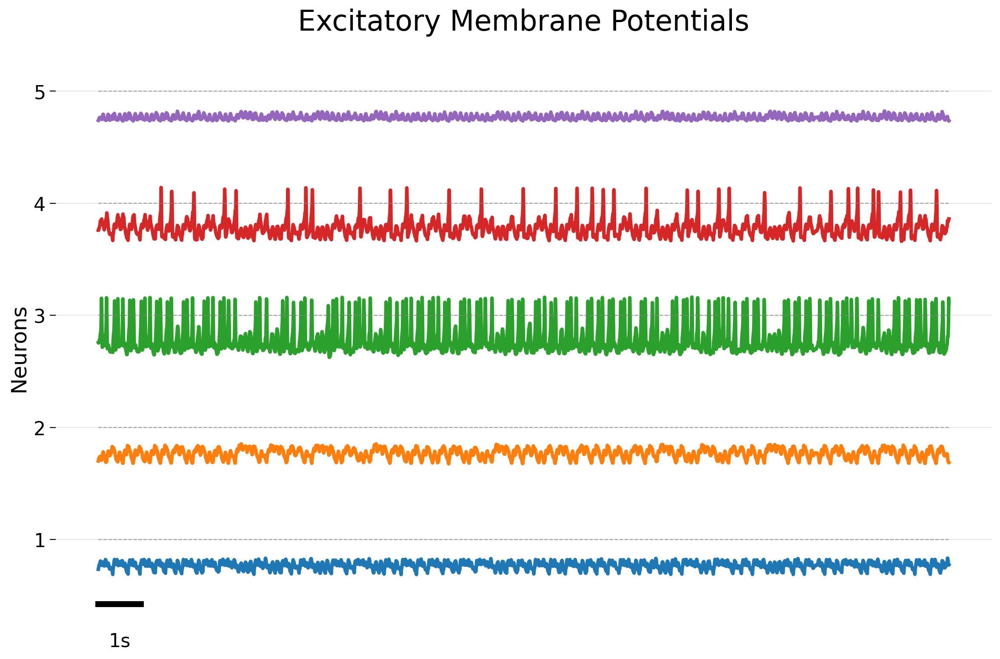

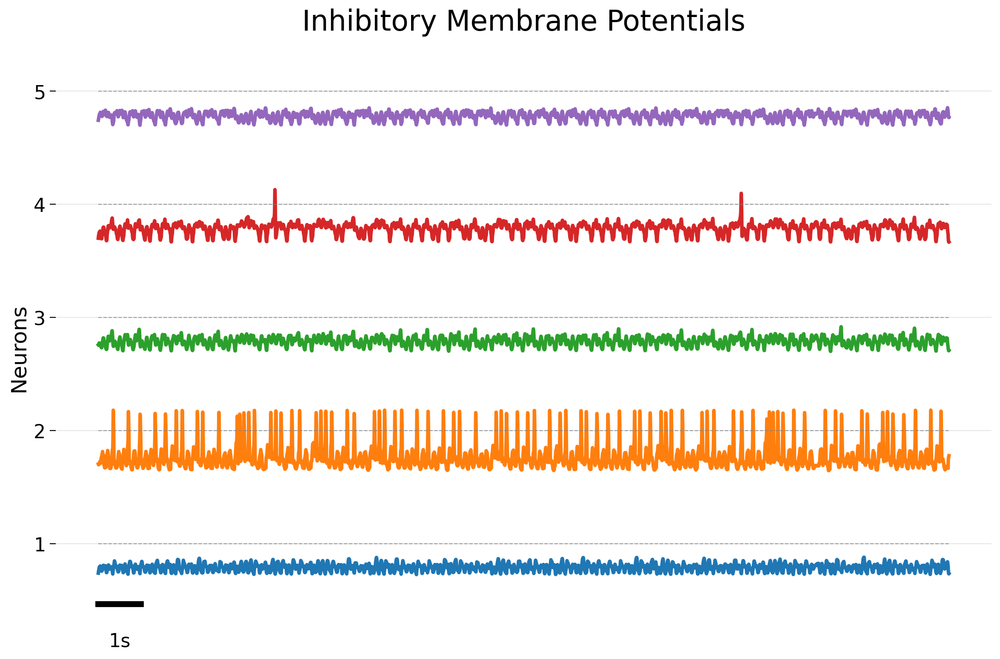

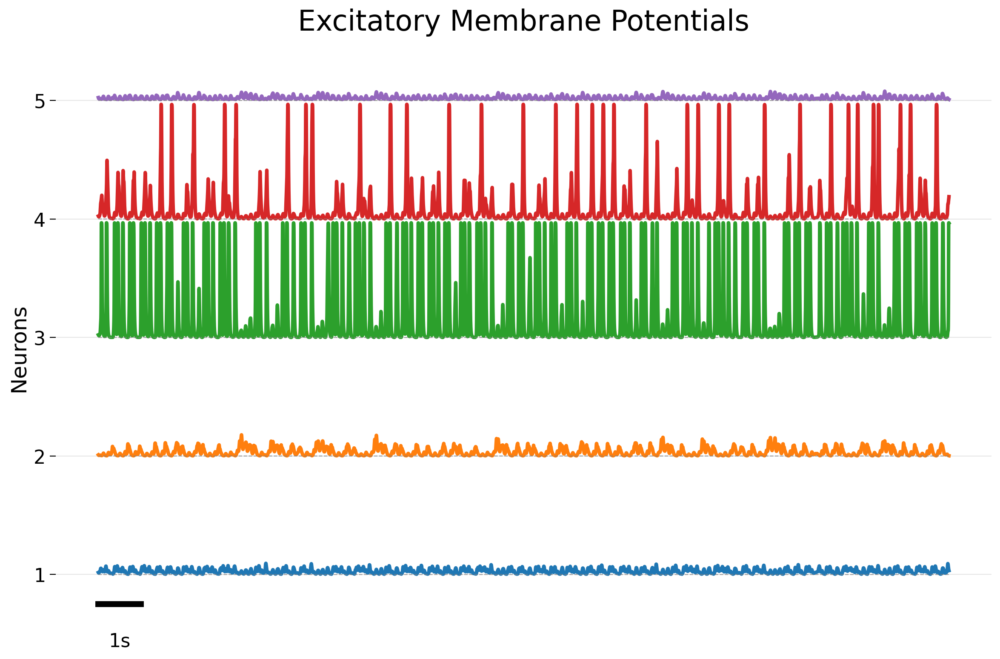

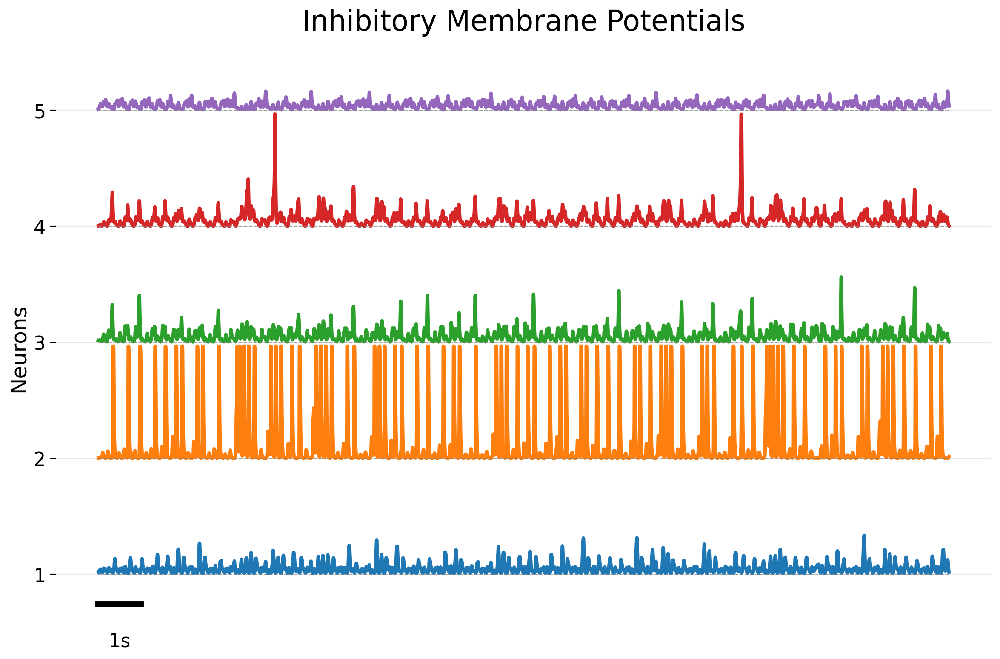

In [20]:
data = {
            'V_e': torch.zeros(generation_len,1000, device=device),
            'n_e': torch.zeros(generation_len, 1000, device=device),
            's_e': torch.zeros(generation_len, 1000, device=device),
            'V_i': torch.zeros(generation_len, 1000, device=device),
            'n_i': torch.zeros(generation_len, 1000, device=device),
            's_i': torch.zeros(generation_len, 1000, device=device)
        }

data = trained_model.get_storage()
plot_voltage_trace_stacked(data, 5, 1, "Voltage_traces_Lorenz")

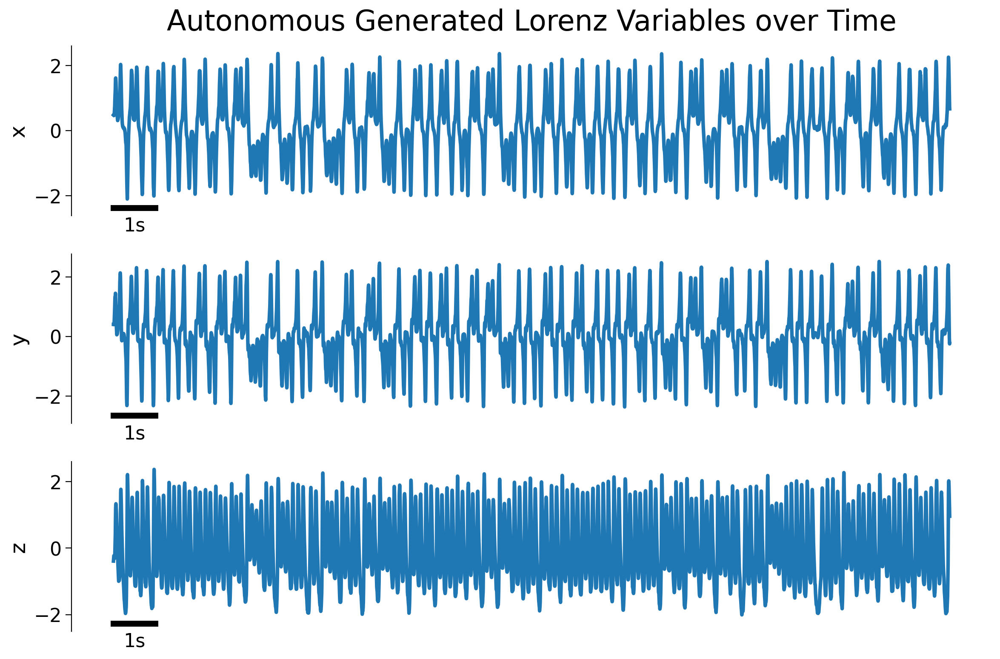

In [21]:
plt.figure(figsize=(12, 8))

for i, label in enumerate(['x', 'y', 'z']):
    plt.subplot(3, 1, i+1)
    # plt.plot(y_test_denorm[:, i], label=f'True {label}')
   #  plt.plot(test_data_normalized[:generation_len, i], label=f'True {label}')
    plt.plot(generated[:, i], label=f'Predicted {label}')
    if i == 0:
        plt.title("Autonomous Generated Lorenz Variables over Time", y=1.05)
    # plt.legend()
    plt.ylabel(label)

    plt.xticks([])
    plt.gca().spines['bottom'].set_visible(False)

    
    x_start = 0
    x_end = 10000
    y_pos = plt.ylim()[0] - 0.01 * (plt.ylim()[1] - plt.ylim()[0]) 
    
    plt.plot([x_start, x_end], [y_pos, y_pos], color='black', linewidth=5)
    plt.text((x_start + x_end) / 2, y_pos - 0.05 * (plt.ylim()[1] - plt.ylim()[0]), "1s", 
        ha='center', va='top', fontsize=16)


plt.savefig("Generated Lorenz.svg", format='svg', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
def generate_trajectory(model, initial_state, states, generation_len):
    model.eval()
    with torch.no_grad():        
        output = model.test(initial_state, generation_len, states)
        generated = np.vstack((initial_state.squeeze(0).cpu().numpy(),output.squeeze(0).cpu().numpy()))

    return np.array(generated).squeeze()

# Generate trajectory
np.random.seed(8)
torch.manual_seed(8)

initial_state = torch.tensor([1.0, 0.0, 0.0]).to(device)
states = None
trained_model.disable_storage()
states, initial_input = trained_model.warmup(initial_state.unsqueeze(0), warmup_duration, states)

generation_len = 5000000
generated = generate_trajectory(trained_model, initial_input, states, generation_len)


In [ ]:
initial_state_denormalized = (initial_input.squeeze().cpu().numpy() * data_std) + data_mean

t_span = (0, 500)
t_eval = np.linspace(t_span[0], t_span[1], 1000000)
solution = solve_ivp(lorenz_system, t_span, initial_state_denormalized, t_eval=t_eval)
test_data_unnormalized = solution.y.T

test_data_normalized = (test_data_unnormalized - data_mean) / data_std

In [ ]:
from scipy.signal import find_peaks

z_model_normalized = generated[:, 2] 

model_peaks_indices, _ = find_peaks(z_model_normalized, prominence=1)
z_model_maxima = z_model_normalized[model_peaks_indices]

z_true = test_data_normalized[:, 2]

true_peaks_indices, _ = find_peaks(z_true, prominence=1)
z_true_maxima = z_true[true_peaks_indices]

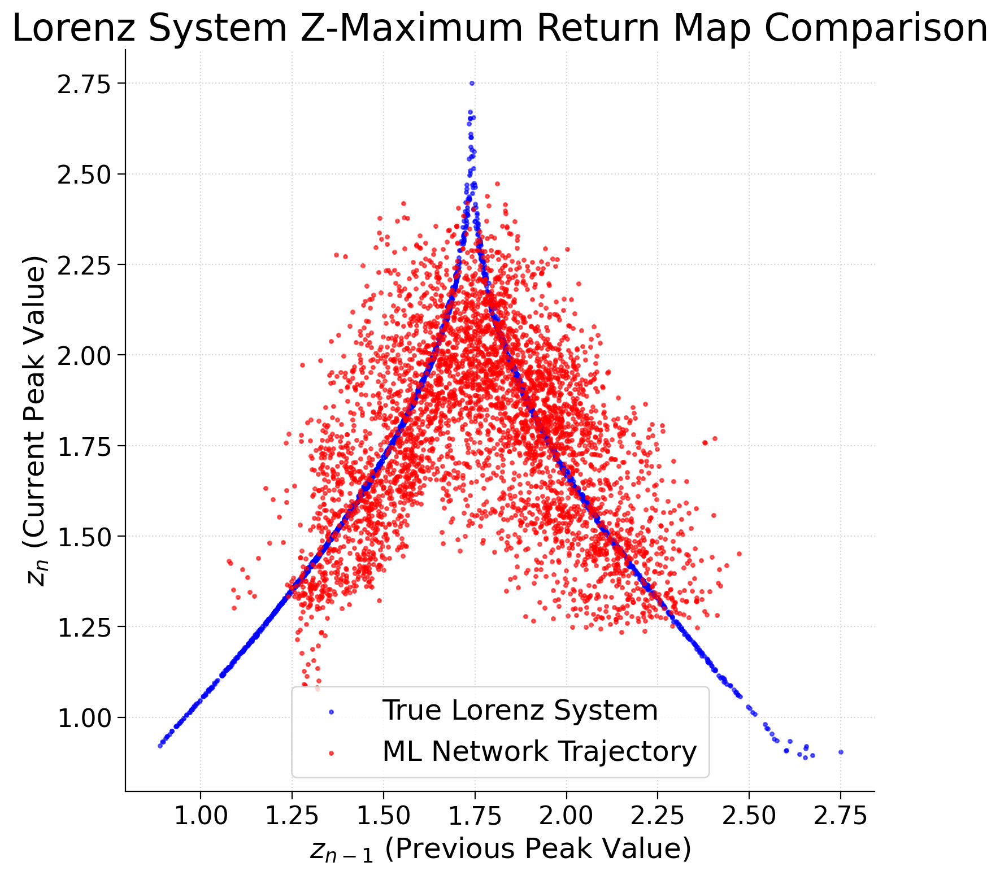

In [ ]:
def compute_return_map(peaks):
    """Computes z_{n-1} vs z_n pairs from a sequence of peaks."""
    # z_{n-1} is all peaks except the last one
    z_prev = peaks[:-1]
    # z_n is all peaks except the first one
    z_curr = peaks[1:]
    return z_prev, z_curr

# Compute return maps
z_prev_true, z_curr_true = compute_return_map(z_true_maxima)
z_prev_model, z_curr_model = compute_return_map(z_model_maxima)

# Plotting the Comparison
plt.figure(figsize=(8, 8))

# Plot True Lorenz Return Map
plt.scatter(
    z_prev_true, 
    z_curr_true, 
    s=5, 
    label='True Lorenz System', 
    color='blue', 
    alpha=0.6
)

# Plot Learned Model Return Map
plt.scatter(
    z_prev_model, 
    z_curr_model, 
    s=5, 
    label='ML Network Trajectory', 
    color='red', 
    alpha=0.6
)

# Set plot labels and title
plt.title('Lorenz System Z-Maximum Return Map Comparison')
plt.xlabel('$z_{n-1}$ (Previous Peak Value)')
plt.ylabel('$z_n$ (Current Peak Value)')

# Add an identity line for reference (where z_n = z_{n-1})
min_val = min(min(z_prev_true), min(z_prev_model))
max_val = max(max(z_curr_true), max(z_curr_model))


plt.legend()
plt.grid(True, linestyle=':', alpha=0.5)
plt.savefig('Return Map.svg', format='svg', dpi=300, bbox_inches='tight')
plt.show()